In [1]:
import os
from glob import glob
import threading

import numpy as np
import dask.dataframe as dd
from dask import delayed
import pandas as pd
import xarray as xr
import scipy.optimize

%matplotlib inline
from matplotlib import pyplot as plt
#import matplotlib.animation as anima

In [2]:
import crocosi.postp as pp
from crocosi.jet import set_relevant_time
import phdequinox.croco_drifter as cdr

In [7]:
from dask.distributed import Client, LocalCluster
#cluster = LocalCluster()
from dask_jobqueue import PBSCluster
cluster = PBSCluster()
w = cluster.scale(jobs=4)

In [8]:
from dask.distributed import Client
#client = Client()  # set up local cluster on your laptop
client = Client(cluster) # with distributed cluster

In [9]:
client

Client Scheduler: tcp://10.148.0.63:54200 Dashboard: http://10.148.0.63:8787/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [10]:
root_path = '/home/datawork-lops-osi/equinox/jetn/'
#root_path = '/home1/datawork/slgentil/'#jet_cfg1_wp75_4km_1500a2000j_floats_lev50
run = 'jet_cfg1_wp7_m1a1_4km_500a1000j/'

In [2]:
eulerian_field = xr.open_dataset(root_path+run+'diagnostics/ZC_Eulerian_field.nc').persist()

NameError: name 'root_path' is not defined

### Lagrangian

In [11]:
dr = cdr.drifter_dataframe(root_path+run,parquet=True,index='id',persist=False)
dr

         time      xgrid      ygrid  zgrid     depth       temp         u  \
id                                                                          
1   600.00000  33.356374  159.48892   50.0  0.572250  24.582194 -0.082634   
1   501.95833  13.180805  150.65611   50.0  0.537752  24.579426 -0.000728   
1   732.68056  23.727682  158.53919   50.0  0.599554  24.583154 -0.032861   
1   501.95139  13.180899  150.65581   50.0  0.537585  24.579427 -0.000702   
1   501.94444  13.180986  150.65561   50.0  0.537425  24.579427 -0.000644   

           v          dudt          dvdt      pres           x          y  
id                                                                         
1  -0.135108 -1.175285e-05  1.304720e-05  6.488984  133.425496  637.95568  
1   0.002902 -2.919962e-08  1.056137e-06  6.150439   52.723220  602.62444  
1   0.127024  1.172042e-05  1.488676e-06  6.756877   94.910728  634.15676  
1   0.002273 -8.397632e-08  1.023945e-06  6.148801   52.723596  602.62324  
1   

#### Eulerian

In [12]:
gparams = {'f0': 1.0313e-4, 'beta': 1.6186e-11}
r = pp.Run(root_path+run, prefix='', outputs=['surf','his'], verbose=False)
r['surf'] = r['surf'].rename({'time_instant': 'time'})

In [13]:
V = ['u_a', 'v_a']#,'ssh'
dij = 1
dti = 1
ds_a = (r['his'][V].isel({'x_rho': slice(0,None,dij), 'x_u': slice(0,None,dij),
                         'y_rho': slice(0,None,dij), 'y_v': slice(0,None,dij),
                         'time': slice(0,None,dti)})
     ).squeeze()
print('dataset size: %.0f GB' %(ds_a.nbytes/1e9))

dataset size: 2 GB


In [14]:
V = ['u', 'v','ssh']
dij = 1
dti = 1
ds = (r['surf'][V].isel({'x_rho': slice(0,None,dij), 'x_u': slice(0,None,dij),
                         'y_rho': slice(0,None,dij), 'y_v': slice(0,None,dij),
                         'time': slice(0,None,dti)})
     ).squeeze()
print('dataset size: %.0f GB' %(ds.nbytes/1e9))

dataset size: 54 GB


In [15]:
x,y,t = 'auto', 'auto' , 'auto'
ds = ds.chunk({'time': t, 'x_rho': x, 'x_u': x, 'y_rho': y, 'y_v': y})

In [16]:
from collections import OrderedDict

def _get_spatial_dims(v):
    """ Return an ordered dict of spatial dimensions in the s/z, y, x order
    """
    dims = OrderedDict( (d, next((x for x in v.dims if x[0]==d), None))
                        for d in ['s','y','x'] )
    return dims
def x2rho(v, grid,boundary):
    """ Interpolate from any grid to rho grid
    """
    dims = _get_spatial_dims(v)
    vout = v.copy()
    if dims['x'] == 'x_u':
        vout = grid.interp(vout, 'xi',boundary=boundary)
    if dims['y'] == 'y_v':
        vout = grid.interp(vout, 'eta',boundary=boundary)
    return vout

In [19]:
for V in ['u','v']:
    ds[V] = x2rho(ds[V],r.xgrid,'extrapolate')
    ds_a[V+'_a'] = x2rho(ds_a[V+'_a'],r.xgrid,'extrapolate')

In [20]:
ds = ds.persist()
ds_a = ds_a.persist()


In [15]:
ds_a['KE'] = np.sqrt(ds_a['u_a']**2+ds_a['v_a']**2)
ds_a['Mean'] = (ds_a.u_a**2+ds_a.v_a**2).mean(['time','x_rho'])
ds_a['EKE'] = np.sqrt((ds_a['u_a']-ds_a['u_a'].mean(['time','x_rho']))**2+(ds_a['v_a']-ds_a['v_a'].mean(['time','x_rho']))**2)
#ds['KE'] = np.sqrt(ds['u']**2+ds['v']**2)

In [21]:
tmid = 750#(t0+t1)/2
#t0 = tmid-7.5
#t1 = tmid+7.5
t0 = tmid-20
t1 = tmid+20
imid = (tmid-500)*24*6

In [22]:
df = dr.df.reset_index()
df = df.set_index('time').persist()

In [19]:
#df = dr.df.loc[225].compute()
dsi = ds.u.isel(time=250*24*2).persist()

In [20]:
dfx = (df.x.loc[750]*1e3).compute()
dfy = (df.y.loc[750]*1e3).compute()

In [12]:
KE = 0.5*np.sqrt(ds.u**2+ds.v**2)


### Infos simulation : 

Text(0.5, 1.0, 'EKE jet')

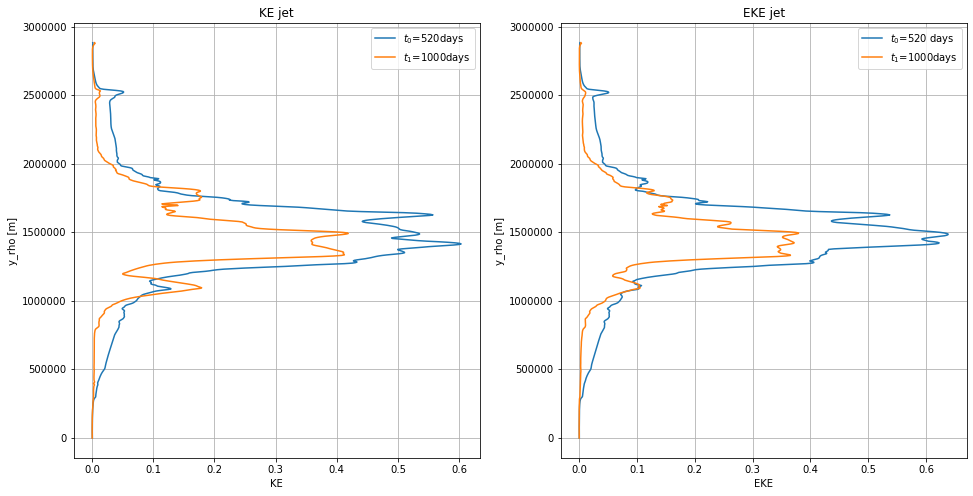

In [13]:
fig,axs=plt.subplots(1,2,figsize=(16,8))
ds_a['KE'].isel(time=0,s_rho=-1).mean(['x_rho']).plot(ax=axs[0],y='y_rho',label=r'$t_0$=520days')
ds_a['KE'].isel(time=-1,s_rho=-1).mean(['x_rho']).plot(ax=axs[0],y='y_rho',label=r'$t_1$=1000days')
axs[0].legend();axs[0].grid();axs[0].set_title('KE jet')
ds_a['EKE'].isel(time=0,s_rho=-1).mean(['x_rho']).plot(ax=axs[1],y='y_rho',label=r'$t_0$=520 days')
ds_a['EKE'].isel(time=-1,s_rho=-1).mean(['x_rho']).plot(ax=axs[1],y='y_rho',label=r'$t_1$=1000days')
axs[1].legend();axs[1].grid();axs[1].set_title('EKE jet')

In [14]:
print('Max jet KE at the beginning : ',ds_a.KE.isel(time=0,s_rho=-1).mean(['x_rho']).max().compute().values)
print('Max jet KE at the end : ',ds_a.KE.isel(time=-1,s_rho=-1).mean(['x_rho']).max().compute().values)
print('Max jet EKE at the beginning : ',ds_a.EKE.isel(time=0,s_rho=-1).mean(['x_rho']).max().compute().values)
print('Max jet EKE at the end : ',ds_a.EKE.isel(time=-1,s_rho=-1).mean(['x_rho']).max().compute().values)

Max jet KE at the beginning :  0.6033324
Max jet KE at the end :  0.41874173
Max jet EKE at the beginning :  0.637945
Max jet EKE at the end :  0.37939414


In [18]:
df.index.min().compute()

500.00694000000004

In [19]:
df0 = df.loc[500.00694000000004].compute()

In [22]:
print('Minimum y at intial time t=500days : %skm'% df0.y.min())
print('Maximum y at intial time t=500days : %skm'% df0.y.max())

Minimum y at intial time t=500days : 601.99356km
Maximum y at intial time t=500days : 2402.01052km


### Fig 1 : Presentation of the simulation

In [23]:
ds_a.KE.mean(['time','x_rho'])

<xarray.DataArray 'KE' (s_rho: 50, y_rho: 722)>
dask.array<mean_agg-aggregate, shape=(50, 722), dtype=float32, chunksize=(50, 720), chunktype=numpy.ndarray>
Coordinates:
    f_rho    (y_rho) float32 7.978978e-05 7.985453e-05 ... 0.00012647022
    y_u      (y_rho) float32 dask.array<chunksize=(722,), meta=np.ndarray>
  * s_rho    (s_rho) float32 -0.99 -0.97 -0.95 -0.93 ... -0.07 -0.05 -0.03 -0.01
  * y_rho    (y_rho) float32 -2000.0 2000.0 6000.0 ... 2878000.0 2882000.0
    f        (y_rho) float32 7.978978e-05 7.985453e-05 ... 0.00012647022

Text(0.5, 1.0, 'Time=750 days')

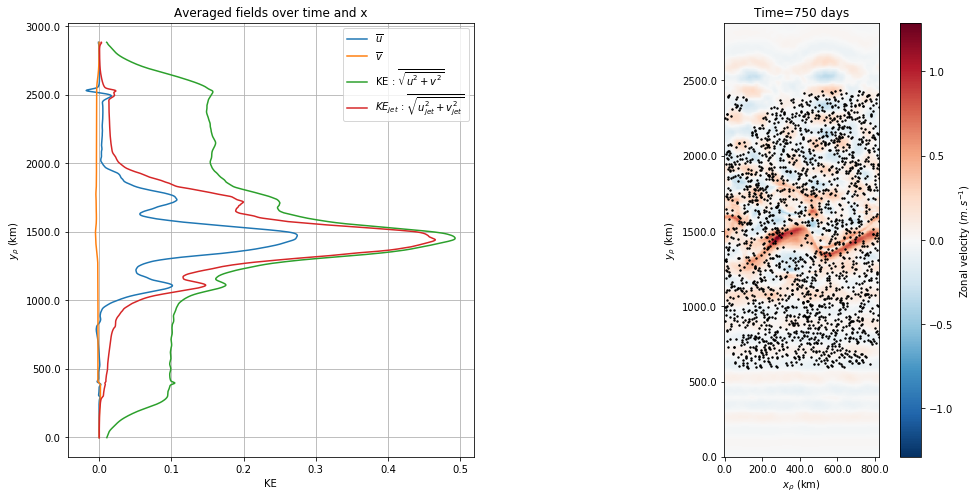

In [24]:
fig,axs= plt.subplots(1,2,figsize=(16,8))
ax = axs[0]
ds.u.mean(['time','x_rho']).plot(ax=ax,y='y_rho',label=r'$\overline{u}$')
ds.v.mean(['time','x_rho']).plot(ax=ax,y='y_rho',label=r'$\overline{v}$')
ds.KE.mean(['time','x_rho']).plot(ax=ax,y='y_rho',label=r'KE : $\overline{\sqrt{u^2+v^2}}$')
ds_a.KE.isel(s_rho=-1).mean(['time','x_rho']).plot(ax=ax,y='y_rho',label=r'$KE_{jet}$ : $\overline{\sqrt{u_{jet}^2+v_{jet}^2}}$')
laby = ax.get_yticks();laby = [str(l*1e-3) for l in laby];
ax.set_yticklabels(laby)
ax.set_ylabel(r'$y_\rho$ (km)')#;ax.set_xlabel(r'$x_\rho$ (km)')
ax.grid();ax.legend();ax.set_title(r'Averaged fields over time and x')
ax = axs[1]
dsi.plot(ax=ax,cbar_kwargs={'label':r'Zonal velocity ($m.s^{-1}$)'})
labx,laby = ax.get_xticks(),ax.get_yticks();labx,laby = [str(l*1e-3) for l in labx],[str(l*1e-3) for l in laby];
ax.set_yticklabels(laby);ax.set_xticklabels(labx)
ax.set_ylabel(r'$y_\rho$ (km)');ax.set_xlabel(r'$x_\rho$ (km)')
#ax.plot(df.x.loc[t0:t1]*1e3,df.y.loc[t0:t1]*1e3)
#ax.plot(df.x.loc[t0]*1e3,df.y.loc[t0]*1e3,marker='o',color='r',markeredgecolor='w');
#ax.plot(df.x.loc[tmid]*1e3,df.y.loc[tmid]*1e3,marker='d',color='b',markeredgecolor='w')
ax.scatter(dfx[::4],dfy[::4],s=2,c='k')
ax.set_aspect('equal')
ax.set_title('Time=%s days'%750)
#fig.savefig('/home1/datawork/zcaspar/Figs/drifters_simu.png')

#### Comments : 
Left : \
Mean zonal velocity (average over time and x axis)\
Averaged KE (computed using the entire velocity) : peak in the jet and energy in the northern area\
Right : \
Zonal velocity at mid time (1750days) and distribution of 1/4 of the drifters at that time\
we can see the jet and the internal tides in u. It also illustrates the fact that we don"t seem have areas without drifters 

In [12]:
KE_a = np.sqrt((ds_a.u_a-ds_a.u_a.mean(['time','x_rho']))**2+(ds_a.v_a-ds_a.v_a.mean(['time','x_rho']))**2).mean(['time','x_rho']).compute()
U_a = np.sqrt((ds_a.u_a-ds_a.u_a.mean(['time','x_rho']))**2).mean(['time','x_rho']).compute()
V_a = np.sqrt((ds_a.v_a-ds_a.v_a.mean(['time','x_rho']))**2).mean(['time','x_rho']).compute()

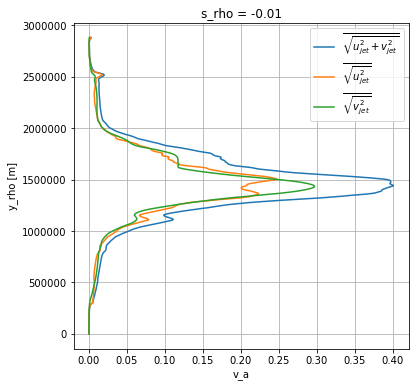

In [25]:
fig,ax = plt.subplots(figsize=(6,6))
KE_a.isel(s_rho=-1).plot(y='y_rho',label=r'$\overline{\sqrt{u_{jet}^2+v_{jet}^2}}$',ax=ax)
U_a.isel(s_rho=-1).plot(y='y_rho',label=r'$\overline{\sqrt{u_{jet}^2}}$',ax=ax)
V_a.isel(s_rho=-1).plot(y='y_rho',label=r'$\overline{\sqrt{v_{jet}^2}}$',ax=ax)
ax.grid();ax.legend()

In [23]:
df_loc = df.loc[750].compute()
df_loc = df_loc.sort_values('y').set_index('y')

In [24]:
id_north = df_loc.loc[2290:2310].id.values[int(df_loc.loc[2290:2310].id.size/2)]
id_south = df_loc.loc[690:710].id.values[int(df_loc.loc[690:710].id.size/2)]
id_jet = df_loc.loc[1490:1510].id.values[int(df_loc.loc[1490:1510].id.size/2)]

In [25]:
time = dr.df.time.values.compute()

In [26]:
df_jet = dr.df.loc[id_jet].compute()
df_north = dr.df.loc[id_north].compute()
df_south = dr.df.loc[id_south].compute()

### Fig 2 : trajectory of 3 drifters in three areas (south, jet and north) over 40 days

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:33: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futur

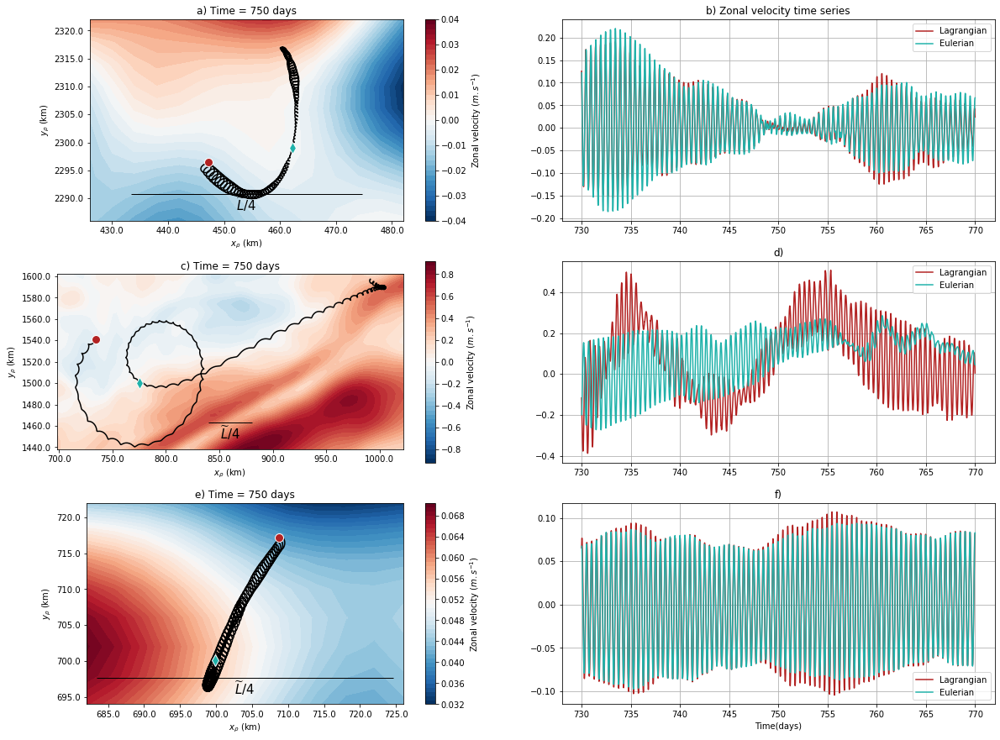

In [49]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
fontprops = fm.FontProperties(size=15)

ce = 'lightseagreen'
cl = 'firebrick'
num,num2 = ['a)', 'c)','e)'],['b)', 'd)','f)']
fig = plt.figure(figsize=(20,15))
grid = plt.GridSpec(3, 4, wspace=0.4, hspace=0.2)
for df,i in zip([df_north,df_jet,df_south],range(3)):
    df =df.sort_values('time').set_index('time')
    ds_zoom = ds.u.sel(x_rho = slice((df.x.loc[t0:t1].min()-20)*1e3,(df.x.loc[t0:t1].max()+20)*1e3),
                       y_rho = slice((df.y.loc[t0:t1].min()-5)*1e3,(df.y.loc[t0:t1].max()+5)*1e3)).persist()
    #ds_zoom = ds_zoom.isel(time=57*24*6).compute()
    ax = plt.subplot(grid[i,:2])
    ds_zoom.isel(time=250*24*2).plot.contourf(ax=ax,cmap='RdBu_r',levels=50,cbar_kwargs={'label':r'Zonal velocity ($m.s^{-1}$)'})#.isel(time=57*24*6).plot(ax=ax)
    labx,laby = ax.get_xticks(),ax.get_yticks();labx,laby = [str(l*1e-3) for l in labx],[str(l*1e-3) for l in laby];
    ax.set_xticklabels(labx);ax.set_yticklabels(laby)
    ax.set_ylabel(r'$y_\rho$ (km)');ax.set_xlabel(r'$x_\rho$ (km)')
    ax.plot(df.x.loc[t0:t1]*1e3,df.y.loc[t0:t1]*1e3,'k')
    ax.plot(df.x.loc[t0:t0]*1e3,df.y.loc[t0:t0]*1e3,marker='o',color=cl,markeredgecolor='w',ms=10);
    ax.plot(df.x.loc[tmid:tmid]*1e3,df.y.loc[tmid:tmid]*1e3,marker='d',color=ce,markeredgecolor='w',ms=10)
    ax.set_aspect('equal');ax.set_title('%s Time = %s days'%(num[i],tmid))
    ax=plt.subplot(grid[i,2:])
    df.u.loc[t0:t1].plot(ax=ax,c=cl,label='Lagrangian')
    ds_zoom.sel(x_rho=df.x.loc[tmid:tmid]*1e3,y_rho=df.y.loc[tmid:tmid+1.2]*1e3,method='nearest')[:,0,0].isel(time=slice(int(230*24*2),int(270*24*2))).plot(ax=ax,label='Eulerian',c=ce)
    ax.legend();ax.set_ylabel('');ax.grid();ax.set_xlabel('');ax.set_title('%s'%num2[i])
ax.set_xlabel('Time(days)');
ax=plt.subplot(grid[0,2:])
ax.set_title('b) Zonal velocity time series')
fig.tight_layout()
for i in range(3):
    ax = plt.subplot(grid[i,:2])
    scalebar = AnchoredSizeBar(ax.transData,165/4*1e3, r'$\widetilde{L}/4$', 'lower center', pad=0.5,color='k',
                            frameon=False,
                            size_vertical=0,
                            fontproperties=fontprops)

    ax.add_artist(scalebar)
plt.show()
fig.savefig('/home1/datawork/zcaspar/Fig_paper/flts_traj.pdf')

### Fig 2 : trajectory of 3 drifters in three areas (south, jet and north) over 15 days

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futur

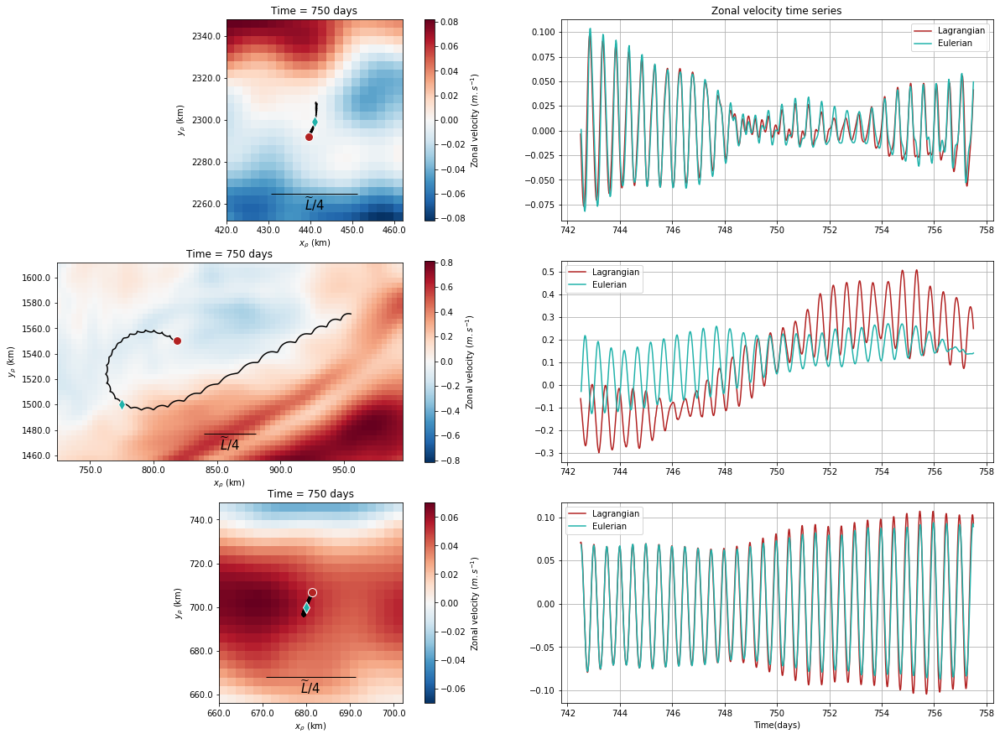

In [29]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
fontprops = fm.FontProperties(size=15)

ce = 'lightseagreen'
cl = 'firebrick'
fig = plt.figure(figsize=(20,15))
grid = plt.GridSpec(3, 4, wspace=0.4, hspace=0.2)
for df,i in zip([df_north,df_jet,df_south],range(3)):
    df =df.sort_values('time').set_index('time')
    ds_zoom = ds.u.sel(x_rho = slice((df.x.loc[t0:t1].min()-40)*1e3,(df.x.loc[t0:t1].max()+40)*1e3),
                       y_rho = slice((df.y.loc[t0:t1].min()-40)*1e3,(df.y.loc[t0:t1].max()+40)*1e3)).persist()
    #ds_zoom = ds_zoom.isel(time=57*24*6).compute()
    ax = plt.subplot(grid[i,:2])
    ds_zoom.isel(time=250*24*2).plot(ax=ax,cbar_kwargs={'label':r'Zonal velocity ($m.s^{-1}$)'})#.isel(time=57*24*6).plot(ax=ax)
    labx,laby = ax.get_xticks(),ax.get_yticks();labx,laby = [str(l*1e-3) for l in labx],[str(l*1e-3) for l in laby];
    ax.set_xticklabels(labx);ax.set_yticklabels(laby)
    ax.set_ylabel(r'$y_\rho$ (km)');ax.set_xlabel(r'$x_\rho$ (km)')
    ax.plot(df.x.loc[t0:t1]*1e3,df.y.loc[t0:t1]*1e3,'k')
    ax.plot(df.x.loc[t0:t0]*1e3,df.y.loc[t0:t0]*1e3,marker='o',color=cl,markeredgecolor='w',ms=10);
    ax.plot(df.x.loc[tmid:tmid]*1e3,df.y.loc[tmid:tmid]*1e3,marker='d',color=ce,markeredgecolor='w',ms=10)
    ax.set_aspect('equal');ax.set_title('Time = %s days'%tmid)
    ax=plt.subplot(grid[i,2:])
    df.u.loc[t0:t1].plot(ax=ax,c=cl,label='Lagrangian')
    ds_zoom.sel(x_rho=df.x.loc[tmid:tmid]*1e3,y_rho=df.y.loc[tmid:tmid+1.2]*1e3,method='nearest')[:,0,0].isel(time=slice(int(242.5*24*2),int(257.5*24*2))).plot(ax=ax,label='Eulerian',c=ce)
    ax.legend();ax.set_ylabel('');ax.grid();ax.set_xlabel('');ax.set_title('')
ax.set_xlabel('Time(days)');
ax=plt.subplot(grid[0,2:])
ax.set_title('Zonal velocity time series')
fig.tight_layout()
for i in range(3):
    ax = plt.subplot(grid[i,:2])
    scalebar = AnchoredSizeBar(ax.transData,165/4*1e3, r'$\widetilde{L}/4$', 'lower center', pad=0.5,color='k',
                            frameon=False,
                            size_vertical=0,
                            fontproperties=fontprops)

    ax.add_artist(scalebar)
plt.show()

#### Comments:
The trajectory of the dirfter is in black. The background represents the zonal velocity at t=750days. The red point corresponds to the position of the drifter at t0 and the blue one to the position at t=750d.\
The time series in the right panels are the ones along the drifter trajectory (in red) and at the blue point (fixed eulerian time series).\
We don't see a lot of differences between northern and southern area in this simulation. 

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futur

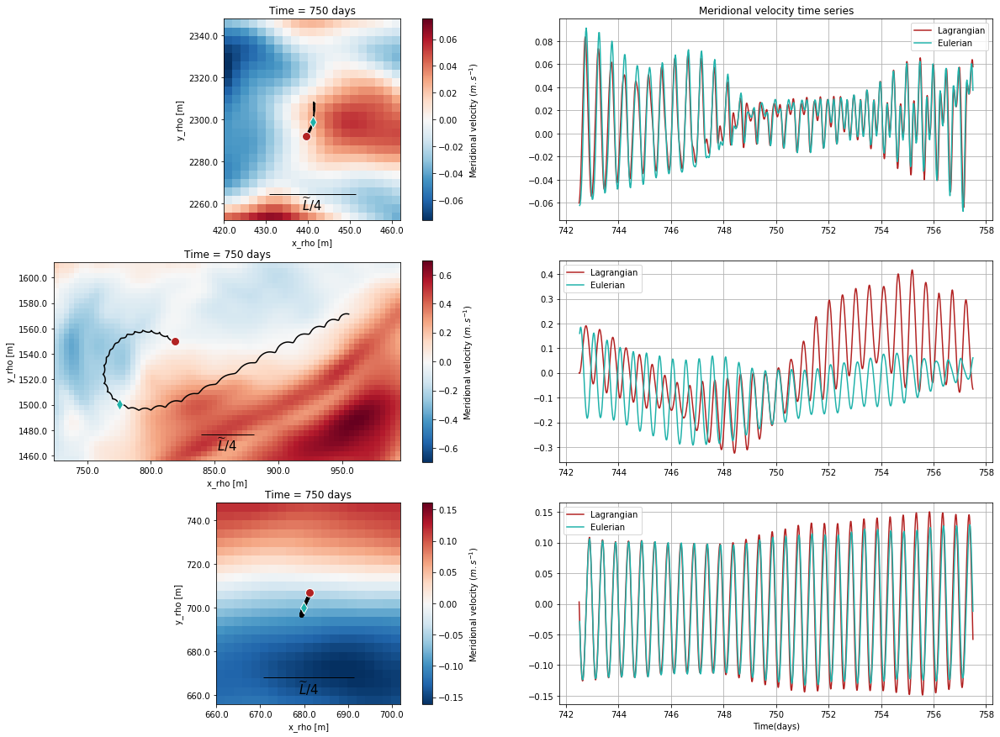

In [30]:
fig = plt.figure(figsize=(20,15))
grid = plt.GridSpec(3, 4, wspace=0.4, hspace=0.2)
for df,i in zip([df_north,df_jet,df_south],range(3)):
    df =df.sort_values('time').set_index('time')
    ds_zoom = ds.v.sel(x_rho = slice((df.x.loc[t0:t1].min()-40)*1e3,(df.x.loc[t0:t1].max()+40)*1e3),
                       y_rho = slice((df.y.loc[t0:t1].min()-40)*1e3,(df.y.loc[t0:t1].max()+40)*1e3)).persist()
    #ds_zoom = ds_zoom.isel(time=57*24*6).compute()
    ax = plt.subplot(grid[i,:2])
    ds_zoom.isel(time=250*24*2).plot(ax=ax,cbar_kwargs={'label':r'Meridional velocity ($m.s^{-1}$)'})#.isel(time=57*24*6).plot(ax=ax)
    labx,laby = ax.get_xticks(),ax.get_yticks();labx,laby = [str(l*1e-3) for l in labx],[str(l*1e-3) for l in laby];
    ax.set_xticklabels(labx);ax.set_yticklabels(laby)
    ax.plot(df.x.loc[t0:t1]*1e3,df.y.loc[t0:t1]*1e3,'k')
    ax.plot(df.x.loc[t0]*1e3,df.y.loc[t0]*1e3,marker='o',color=cl,markeredgecolor='w',ms=10);
    ax.plot(df.x.loc[tmid]*1e3,df.y.loc[tmid]*1e3,marker='d',color=ce,markeredgecolor='w',ms=10)
    ax.set_aspect('equal');ax.set_title('Time = %s days'%tmid)
    ax=plt.subplot(grid[i,2:])
    df.v.loc[t0:t1].plot(ax=ax,c=cl,label='Lagrangian')
    ds_zoom.sel(x_rho=df.x.loc[tmid]*1e3,y_rho=df.y.loc[tmid]*1e3,method='nearest').isel(time=slice(int(242.5*24*2),int(257.5*24*2))).plot(ax=ax,label='Eulerian',c=ce)
    ax.legend();ax.set_ylabel('');ax.grid();ax.set_xlabel('');ax.set_title('')
ax.set_xlabel('Time(days)');
ax=plt.subplot(grid[0,2:])
ax.set_title('Meridional velocity time series')
fig.tight_layout()
for i in range(3):
    ax = plt.subplot(grid[i,:2])
    scalebar = AnchoredSizeBar(ax.transData,165/4*1e3, r'$\widetilde{L}/4$', 'lower center', pad=0.5,color='k',
                            frameon=False,
                            size_vertical=0,
                            fontproperties=fontprops)

    ax.add_artist(scalebar)
plt.show()

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futur

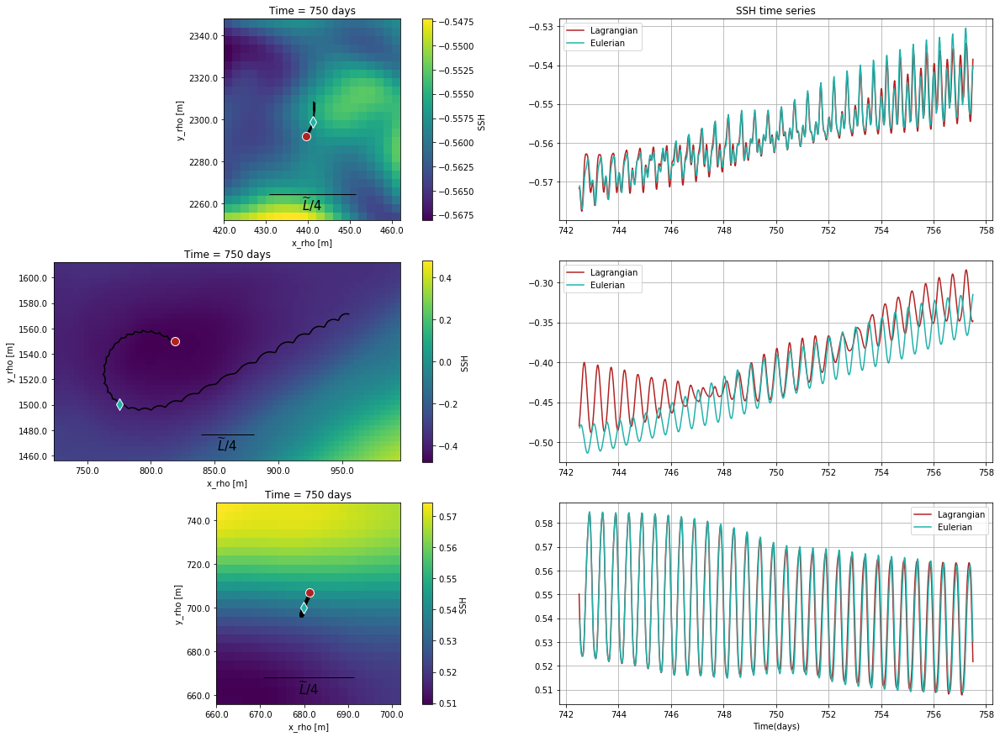

In [38]:
cmap = 'viridis'
fig = plt.figure(figsize=(20,15))
grid = plt.GridSpec(3, 4, wspace=0.4, hspace=0.2)
for df,i in zip([df_north,df_jet,df_south],range(3)):
    df =df.sort_values('time').set_index('time')
    ds_zoom = ds.ssh.sel(x_rho = slice((df.x.loc[t0:t1].min()-40)*1e3,(df.x.loc[t0:t1].max()+40)*1e3),
                       y_rho = slice((df.y.loc[t0:t1].min()-40)*1e3,(df.y.loc[t0:t1].max()+40)*1e3)).persist()
    #ds_zoom = ds_zoom.isel(time=57*24*6).compute()
    ax = plt.subplot(grid[i,:2])
    ds_zoom.isel(time=250*24*2).plot(ax=ax,cmap=cmap,cbar_kwargs={'label':r'SSH '})#.isel(time=57*24*6).plot(ax=ax)
    labx,laby = ax.get_xticks(),ax.get_yticks();labx,laby = [str(l*1e-3) for l in labx],[str(l*1e-3) for l in laby];
    ax.set_xticklabels(labx);ax.set_yticklabels(laby)
    ax.plot(df.x.loc[t0:t1]*1e3,df.y.loc[t0:t1]*1e3,'k')
    ax.plot(df.x.loc[t0]*1e3,df.y.loc[t0]*1e3,marker='o',color=cl,markeredgecolor='w',ms=10);
    ax.plot(df.x.loc[tmid]*1e3,df.y.loc[tmid]*1e3,marker='d',color=ce,markeredgecolor='w',ms=10)
    ax.set_aspect('equal');ax.set_title('Time = %s days'%tmid)
    ax=plt.subplot(grid[i,2:])
    df.depth.loc[t0:t1].plot(ax=ax,c=cl,label='Lagrangian')
    ds_zoom.sel(x_rho=df.x.loc[tmid]*1e3,y_rho=df.y.loc[tmid]*1e3,method='nearest').isel(time=slice(int(242.5*24*2),int(257.5*24*2))).plot(ax=ax,label='Eulerian',c=ce)
    ax.legend();ax.set_ylabel('');ax.grid();ax.set_xlabel('');ax.set_title('')
ax.set_xlabel('Time(days)');
ax=plt.subplot(grid[0,2:])
ax.set_title('SSH time series')
fig.tight_layout()
for i in range(3):
    ax = plt.subplot(grid[i,:2])
    scalebar = AnchoredSizeBar(ax.transData,165/4*1e3, r'$\widetilde{L}/4$', 'lower center', pad=0.5,color='k',
                            frameon=False,
                            size_vertical=0,
                            fontproperties=fontprops)

    ax.add_artist(scalebar)
plt.show()

#### Comments : 
The 2 previous figures areonly there for information and to keep an eye on what happen for other variables

In [39]:
def diags_dist(v1,v2,v3,v4,N):
#    fltI = flt.sel(time=slice(Ti,Tf))
    if v1 is None and v2 is None:
        return pd.Series(np.random.randn(N),index=['xmax','xmin','ymax','ymin','y0','y1','dx','dy','ds'])
    else : 
        dxint = np.abs(v3).mean()#np.diff(np.unwrap(v1)).sum()
        dyint = np.abs(v4).mean()#np.diff(v2).sum()
        dsint = np.sqrt(v3**2+v4**2).mean()#np.diff(np.unwrap(v1))**2+np.diff(v2)**2).sum()
        return pd.Series([np.unwrap(v1).max(),np.unwrap(v1).min(),v2.max(),v2.min(),v2.iloc[0],v2.iloc[-1],dxint,dyint,dsint],
                         index=['xmax','xmin','ymax','ymin','y0','y1','dx','dy','ds'])#,fltI.v

In [40]:
def apply_window(myfun,columns,T,N,L,binsize):
    """Compute diags_dist and returns xarray"""
    df_chunked = dr.df.groupby(dr.df.index).apply(cdr.time_window_processing, myfun, 
                                                  columns,T,N,L
                                                 ).persist()
    y_bins = np.arange(0,2800,binsize)
    y_idx = pd.IntervalIndex.from_breaks(y_bins)
    df_chunked['y0_cut'] = df_chunked['y0'].map_partitions(pd.cut, bins=y_bins)
    df_chunked = (
              df_chunked.map_partitions(
                  lambda df: df.reset_index(level=[1]).rename(columns={'level_1': 'time'})
                                       )
              )
    # difference btw y max and min
    df_chunked['ydiff'] = df_chunked['ymax']-df_chunked['ymin']
    # difference btw x max and min
    df_chunked['xdiff'] = df_chunked['xmax']-df_chunked['xmin']
    DF = df_chunked.compute()
    return DF.set_index(DF.y0_cut.map(lambda v: v.mid)).drop(columns=['time','x','y']).rename(columns={'y0_cut':'y0_bins'}).to_xarray()

In [43]:
ds_dist = {}
for T in [10,20,40,80,120]:
    ds_dist['ds_'+str(T)] = apply_window(diags_dist,['x','y','u','v'],T,9,1024,50)
#ds40 = apply_window(diags_dist,['x','y','u','v'],40,9,L,50)
#ds20 = apply_window(diags_dist,['x','y','u','v'],20,9,L,50)
#ds10 = apply_window(diags_dist,['x','y','u','v'],10,9,L,50)
#ds80 = apply_window(diags_dist,['x','y','u','v'],80,9,L,50)
#ds120 = apply_window(diags_dist,['x','y','u','v'],120,9,L,50)

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  after removing the cwd from sys.path.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  after removing the cwd from sys.path.
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: `meta` is not specified, inferred from parti

In [44]:
ds_stats={}
for T in ['10','20','40','80','120']:
    ds_stats[T] = ds_dist['ds_'+str(T)].groupby('y0_cut').mean()
    ds_stats[T]['Tu'] = (float(T)*24*3600*ds_stats[T].dx*1e-3)
    ds_stats[T]['Tv'] = (float(T)*24*3600*ds_stats[T].dy*1e-3)

### Fig 3 : Distance traveled by the drifters for several time window sizes

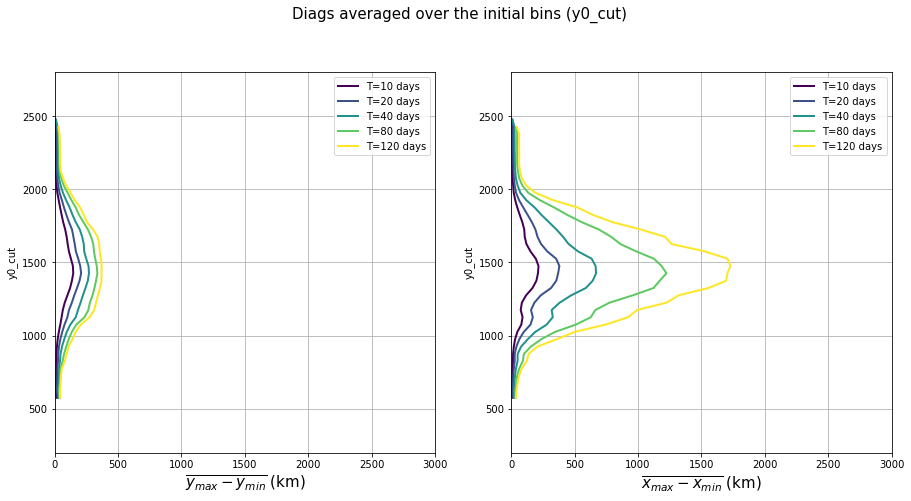

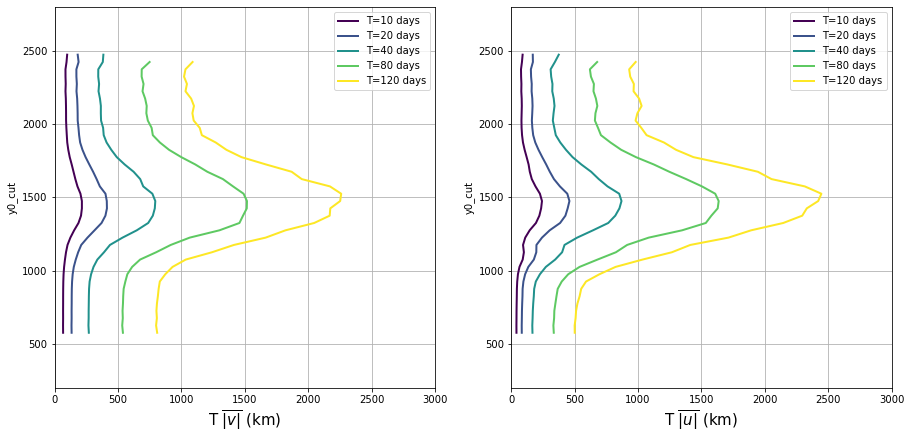

In [45]:
fontsize = 15
number = len(['10','20','40','80','120'])
cmap = plt.get_cmap('viridis')
colors = [cmap(i) for i in np.linspace(0, 1, number)]

fig,axs = plt.subplots(1,2,figsize=(15,7))
fig.suptitle('Diags averaged over the initial bins (y0_cut)',x=0.5,y=1.01,fontsize=fontsize)
for T,c in zip(ds_stats.keys(),colors):
    for var,lab,ax in zip(['ydiff','xdiff'],[r'$\overline{y_{max}-y_{min}}$ (km)',r'$\overline{x_{max}-x_{min}}$ (km)'],axs):
        ds_stats[T][var].plot(y='y0_cut',ax=ax,c=c,linewidth=2,label='T=%s days'%int(T))
        ax.set_xlabel(lab,fontsize=fontsize)
        ax.legend()
        ax.set_xlim(0,3000);ax.set_ylim(200,2800)
axs[0].grid();axs[1].grid()
fig,axs = plt.subplots(1,2,figsize=(15,7))
for T,c in zip(ds_stats.keys(),colors):
    for var,lab, ax in zip(['Tv','Tu'],[r'T $\overline{|v|}$ (km)',r'T $\overline{|u|}$ (km)'],axs):
        ds_stats[T][var].plot(y='y0_cut',ax=ax,c=c,linewidth=2,label='T=%s days'%int(T))
        ax.legend()
        ax.set_xlim(0,3000);ax.set_ylim(200,2800)
        ax.set_xlabel(lab,fontsize=fontsize)
axs[0].grid();axs[1].grid()

#### Comments : 
Not sure where this figure will go yet.\
First line : \
Distance between two extrema in the y and x directions\
Second line : \
Distance that would be covered by the drifters if they just moved in straight line at mean velocity (mean amplitude) during the chosen window size\


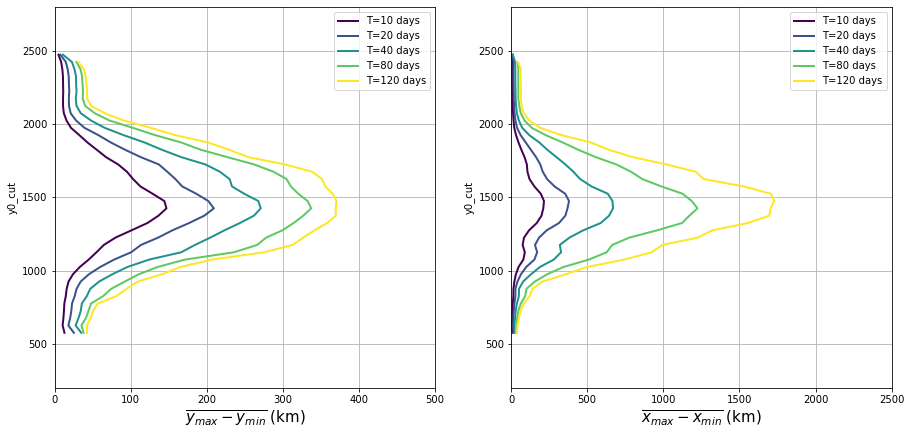

In [46]:
fig,axs = plt.subplots(1,2,figsize=(15,7))

for T,c in zip(ds_stats.keys(),colors):
    for var,lab,ax in zip(['ydiff','xdiff'],[r'$\overline{y_{max}-y_{min}}$ (km)',r'$\overline{x_{max}-x_{min}}$ (km)'],axs):
        ds_stats[T][var].plot(y='y0_cut',ax=ax,c=c,linewidth=2,label='T=%s days'%int(T))
        ax.set_xlabel(lab,fontsize=fontsize)
        ax.legend()
        ax.set_ylim(200,2800)
        ax.grid()
axs[0].set_xlim(0,500);axs[1].set_xlim(0,2500);

#### Comments/notes : 
Zoom of the first line panels in the previous figure. Won't be shown, but will serve to have the values between extrema

### Fig 4 : Comparison to the internal tides scales

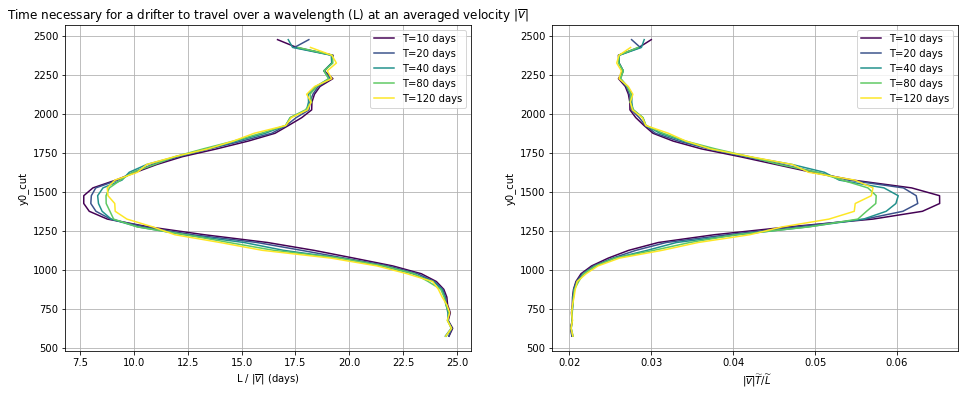

In [47]:
Lbc = 165
Tw = 0.5
fig, ax = plt.subplots(1,2,figsize=(16,6))
for T, c in zip(ds_stats.keys(),colors):
    (Lbc/(24*3600*ds_stats[T].dy*1e-3)).plot(ax=ax[0],y='y0_cut',c=c,label='T=%s days'%int(T))
ax[0].grid();ax[0].set_xlabel(r'L / $\vert\overline{v}\vert$ (days)')
ax[0].set_title(r'Time necessary for a drifter to travel over a wavelength (L) at an averaged velocity $\vert\overline{v}\vert$')
ax[0].legend()
#Tbc = (Lbc/(ds80_stats.dy*1e-3))/24*3600
#Tbc2 = (Lbc/(2*ds80_stats.dy*1e-3))/24*3600

for T, c in zip(ds_stats.keys(),colors):
    (Tw*(24*3600*ds_stats[T].dy*1e-3)/Lbc).plot(ax=ax[1],y='y0_cut',c=c,label='T=%s days'%int(T))
ax[1].grid();ax[1].set_xlabel(r' $\vert\overline{v}\vert\widetilde{T}/\widetilde{L}$')
#ax.set_title(r'Time necessary for a drifter to travel over a wavelength (L) at an averaged velocity $\vert\overline{v}\vert$')
ax[1].legend()

#### Comments/notes : 
Left : \
Time a drifter will need to travel the distance equivalent to one wavelength.\
Right : \
$\beta$ parameter : is the same than normalizing the previous parameter by the period of the waves.

In [3]:
path = root_path+run+'diagnostics/' #datarmor
#path = '/Users/zcaspar/codes/Diagnostics2/'+'wp7/'#'wp7/'#local

Check method for correlation (comparison 2 windows in Eulerian:

In [8]:
corrE = {}
removed = ['T20','T40','T80']#,'total']
for name,data in zip(removed,['ZC_Eulerian_corr_40avg1d.nc','ZC_Eulerian_corr_80avg1d.nc','ZC_Eulerian_corr_160avg1d.nc']):#,'ZC_Eulerian_corr_40total.nc']):
    corrE[name] = xr.open_dataset(path+data).rename({'lags':'lag'})
    for v in ['uu', 'vv']:
        corrE[name][v+'_normalized'] = corrE[name][v]/corrE[name][v].sel(lag=0)
    for v in ['uv']:#
        corrE[name][v+'_normalized'] = corrE[name][v]/np.sqrt(corrE[name]['uu'].sel(lag=0)*corrE[name]['vv'].sel(lag=0))

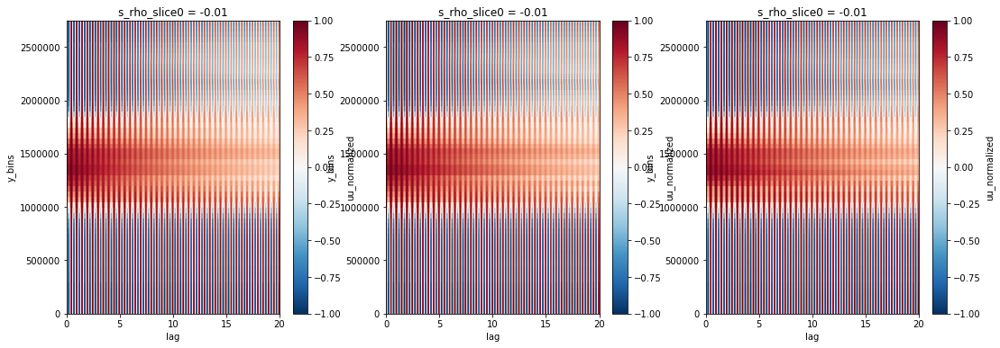

In [7]:
fig, axs = plt.subplots(1,3,figsize=(18,6))
for T, ax in zip(removed,axs):
    corrE[T]['uu_normalized'].plot(ax=ax,x='lag')
    ax.set_xlim(0,20)

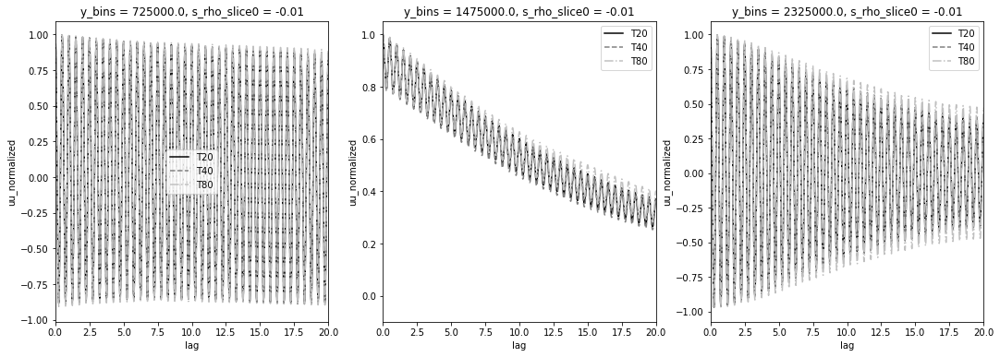

In [18]:
fig,axs = plt.subplots(1,3,figsize=(18,6))
for Y,ax in zip([700,1475,2300],axs):
    for T,c,style in zip(removed,['k','grey','silver'],['-','--','-.']):
        corrE[T]['uu_normalized'].sel(y_bins=Y*1e3, method='nearest').plot(ax=ax,c=c,x='lag',linestyle=style,label=T)
    ax.set_xlim(0,20)
    ax.legend()

In [9]:
from inspect import signature
import scipy


# Parameters
myfunc = C #function to use for the fit
bounds = ((1,0,0,0,0),(2000,np.inf,2000,np.inf,1)) # bounds for the fit to avoid non physical results
ce,cl = 'lightseagreen','firebrick'

In [10]:
out_comb20_avg,out_comb40_avg,out_comb80_avg = {},{},{}
for V in ['uu','vv'] :
    out_comb20_avg[V] = xr.concat([fit(corrE['T20'][V].lag,corrE['T20'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['T20'][V].y_bins],dim='ybin')
    out_comb40_avg[V] = xr.concat([fit(corrE['T40'][V].lag,corrE['T40'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['T40'][V].y_bins],dim='ybin')
    out_comb80_avg[V] = xr.concat([fit(corrE['T80'][V].lag,corrE['T80'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['T80'][V].y_bins],dim='ybin')

    out_comb80_avg[V] = out_comb80_avg[V].assign_coords({'ybin':out_comb80_avg[V].ybin.values*1e-3})
    out_comb40_avg[V] = out_comb40_avg[V].assign_coords({'ybin':out_comb40_avg[V].ybin.values*1e-3})
    out_comb20_avg[V] = out_comb20_avg[V].assign_coords({'ybin':out_comb20_avg[V].ybin.values*1e-3})
    out_comb80_avg[V+'_normalized'] = out_comb80_avg[V].fitted/out_comb80_avg[V].fitted.sel(lags=0)
    out_comb40_avg[V+'_normalized'] = out_comb40_avg[V].fitted/out_comb40_avg[V].fitted.sel(lags=0)
    out_comb20_avg[V+'_normalized'] = out_comb20_avg[V].fitted/out_comb20_avg[V].fitted.sel(lags=0)

In [11]:
lims_uu = [(0,60),(0,0.02),(0,25),(0,0.1),(-0.01,0.05)]
lims_vv = [(0,60),(0,0.02),(0,25),(0,0.1),(-0.01,0.1)]
titles = [r'$\widetilde{T}$',r'$\widetilde{X}$',r'$\overline{T}$',r'$\overline{X}$',r'$\Omega$']

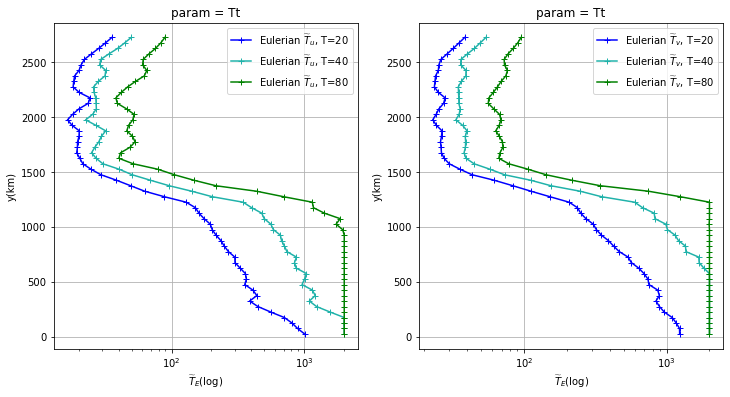

In [32]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V, ax in zip(['uu','vv'],axs):
    out_comb20_avg[V].params.sel(param='Tt').plot(y='ybin',c='b',ax=ax,marker='+',label=r'Eulerian $\widetilde{T}_%s$, T=20'%V[0])
    out_comb40_avg[V].params.sel(param='Tt').plot(y='ybin',c=ce,ax=ax,marker='+',label=r'Eulerian $\widetilde{T}_%s$, T=40'%V[0])
    out_comb80_avg[V].params.sel(param='Tt').plot(y='ybin',c='g',ax=ax,marker='+',label=r'Eulerian $\widetilde{T}_%s$, T=80'%V[0])
    ax.legend();ax.grid()
    ax.set_xscale('log');ax.set_ylabel('y(km)');ax.set_xlabel('$\widetilde{T}_E $(log)')

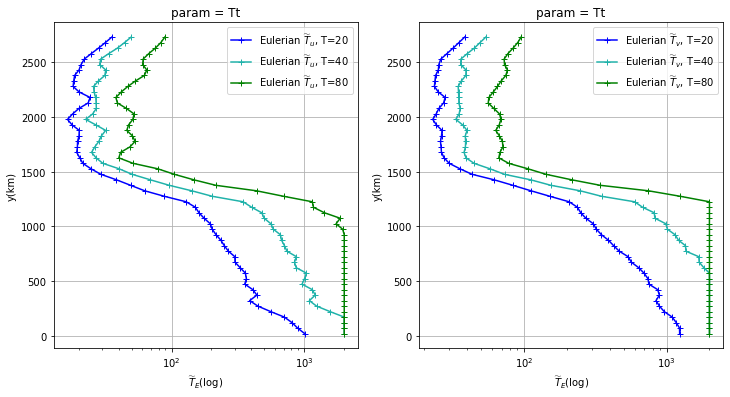

In [13]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V, ax in zip(['uu','vv'],axs):
    out_comb20_avg[V].params.sel(param='Tt').plot(y='ybin',c='b',ax=ax,marker='+',label=r'Eulerian $\widetilde{T}_%s$, T=20'%V[0])
    out_comb40_avg[V].params.sel(param='Tt').plot(y='ybin',c=ce,ax=ax,marker='+',label=r'Eulerian $\widetilde{T}_%s$, T=40'%V[0])
    out_comb80_avg[V].params.sel(param='Tt').plot(y='ybin',c='g',ax=ax,marker='+',label=r'Eulerian $\widetilde{T}_%s$, T=80'%V[0])
    ax.legend();ax.grid()
    ax.set_xscale('log');ax.set_ylabel('y(km)');ax.set_xlabel('$\widetilde{T}_E $(log)')

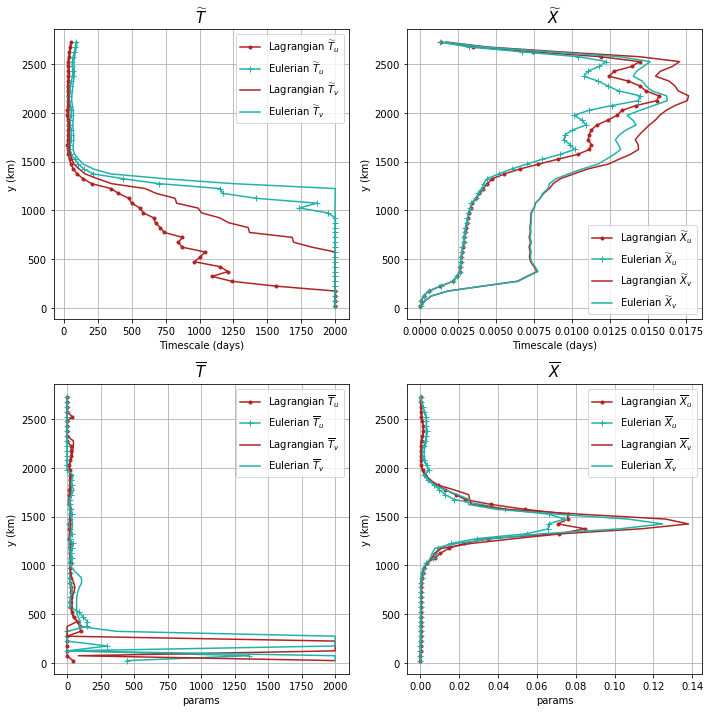

In [14]:
fig,axes = plt.subplots(2,2,figsize=(10,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_uu[:2],axes[0,:]):
    out_comb40_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label=r'Lagrangian $\widetilde{'+pa[0]+'}_u$')
    out_comb80_avg['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label=r'Eulerian $\widetilde{'+pa[0]+'}_u$')
    out_comb40_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,label=r'Lagrangian $\widetilde{'+pa[0]+'}_v$')
    out_comb80_avg['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,label=r'Eulerian $\widetilde{'+pa[0]+'}_v$')
    #ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
    ax.set_xlabel('Timescale (days)');ax.set_ylabel('y (km)')
for pa,title,lim,ax in zip(['Tb','Xbar'],titles[2:],lims_uu[2:],axes[1,:]):
    out_comb40_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label=r'Lagrangian $\overline{'+pa[0]+'}_u$')
    out_comb80_avg['uu'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label=r'Eulerian $\overline{'+pa[0]+'}_u$')
    out_comb40_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,label=r'Lagrangian $\overline{'+pa[0]+'}_v$')
    out_comb80_avg['vv'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,label=r'Eulerian $\overline{'+pa[0]+'}_v$')
    #ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('Timescale (days)')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15);ax.set_ylabel('y (km)')
fig.tight_layout()

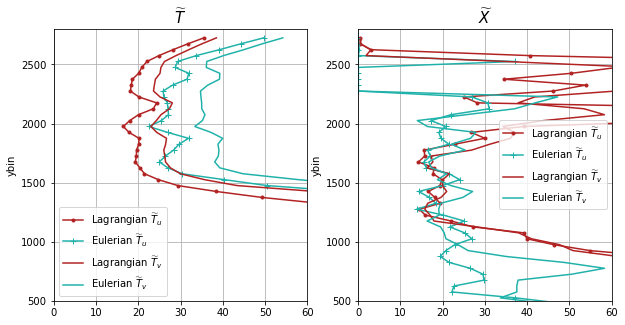

In [18]:
lims_uu = [(0,60),(0,60)]
fig,axes = plt.subplots(1,2,figsize=(10,5))
for pa,title,lim,ax in zip(['Tt','Tb'],titles[:2],lims_uu,axes):
    out_comb40_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label=r'Lagrangian $\widetilde{'+pa[0]+'}_u$')
    out_comb80_avg['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label=r'Eulerian $\widetilde{'+pa[0]+'}_u$')
    out_comb40_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,label=r'Lagrangian $\widetilde{'+pa[0]+'}_v$')
    out_comb80_avg['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,label=r'Eulerian $\widetilde{'+pa[0]+'}_v$')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)

### Autocorrelations T=40days

In [4]:
corrE = {}
removed = ['avg1d']#,'total']
for name,data in zip(removed,['ZC_Eulerian_corr_80avg1d.nc']):#,'ZC_Eulerian_corr_40total.nc']):
    corrE[name] = xr.open_dataset(path+data).rename({'lags':'lag'})
    for v in ['uu', 'vv']:
        corrE[name][v+'_normalized'] = corrE[name][v]/corrE[name][v].sel(lag=0)
    for v in ['uv','vu']:#
        corrE[name][v+'_normalized'] = corrE[name][v]/np.sqrt(corrE[name]['uu'].sel(lag=0)*corrE[name]['vv'].sel(lag=0))

In [5]:
corrL = {}
removed = ['avg1d']#,'total']
for name,data in zip(removed,
                     ['ZC_drifters_corr_80avg1d.nc']):#,'ZC_drifters_corr_40total.nc']):
    corrL[name] = xr.open_dataset(path+data)
    for v in ['uu', 'vv']:
        corrL[name][v+'_normalized'] = corrL[name][v]/corrL[name][v].sel(lag=0)
    for v in ['uv', 'vu']:
        corrL[name][v+'_normalized'] = corrL[name][v]/np.sqrt(corrL[name]['uu'].sel(lag=0)*corrL[name]['vv'].sel(lag=0))

### Fig 5 : Autocorrelation functions

In [13]:
corrL['avg1d']['uu_normalized'].y_bins

<xarray.DataArray 'y_bins' (y_bins: 55)>
array([  25.,   75.,  125.,  175.,  225.,  275.,  325.,  375.,  425.,  475.,
        525.,  575.,  625.,  675.,  725.,  775.,  825.,  875.,  925.,  975.,
       1025., 1075., 1125., 1175., 1225., 1275., 1325., 1375., 1425., 1475.,
       1525., 1575., 1625., 1675., 1725., 1775., 1825., 1875., 1925., 1975.,
       2025., 2075., 2125., 2175., 2225., 2275., 2325., 2375., 2425., 2475.,
       2525., 2575., 2625., 2675., 2725.])
Coordinates:
  * y_bins   (y_bins) float64 25.0 75.0 125.0 ... 2.625e+03 2.675e+03 2.725e+03

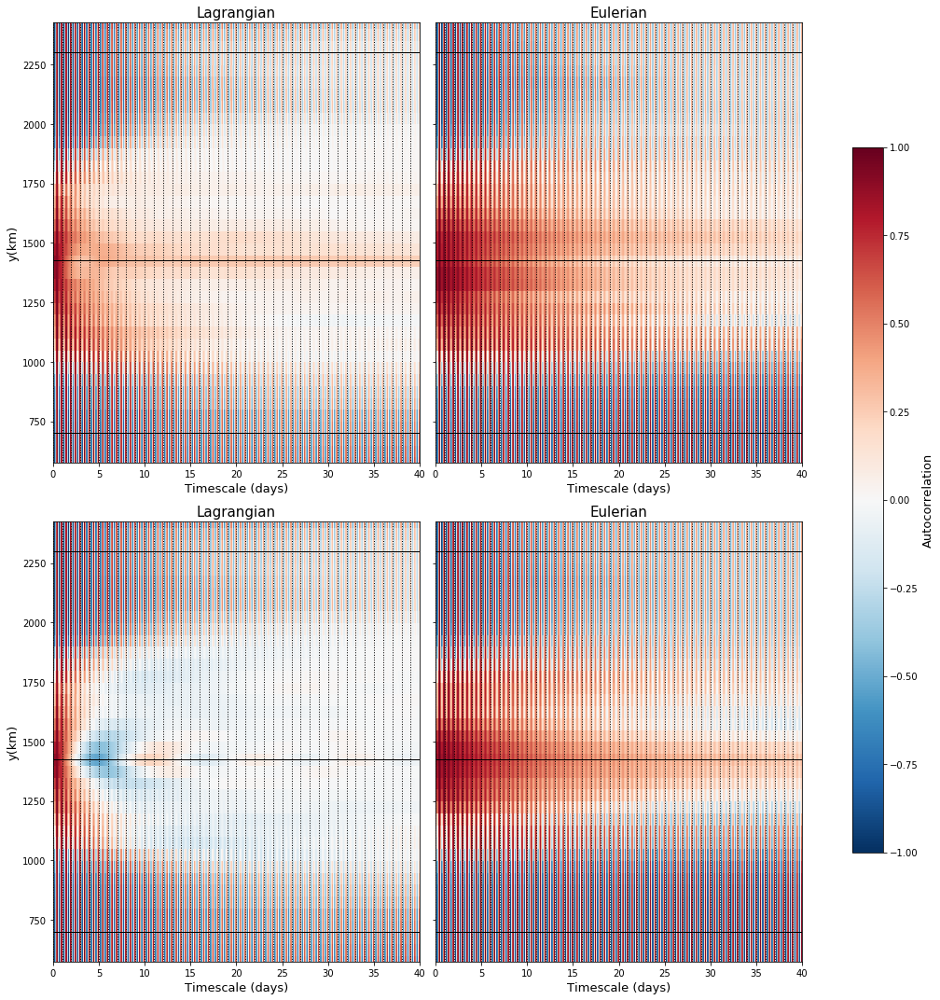

In [17]:
fig,ax = plt.subplots(2,2,figsize=(15,15))
ymax = corrL['avg1d']['uu_normalized'].dropna(dim='y_bins').y_bins.max()
ymin = corrL['avg1d']['uu_normalized'].dropna(dim='y_bins').y_bins.min()

for V,i in zip(['uu','vv'],range(2)):
    im = corrL['avg1d'][V+'_normalized'].plot(ax=ax[i,0],add_colorbar=False);ax[i,0].set_ylabel('')
    corrE['avg1d'][V+'_normalized'].plot(ax=ax[i,1],add_colorbar=False);ax[i,1].set_ylabel('')
    [ax[i,0].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,40,2*0.5)]
    ax[i,0].set_title('Lagrangian',fontsize=15);ax[i,0].set_ylabel('y(km)',fontsize=13);
    ax[i,0].set_xlabel('Timescale (days)',fontsize=13)
    [ax[i,1].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,40,2*0.5)]
    ax[i,1].set_title('Eulerian',fontsize=15);ax[i,1].set_yticklabels('')#;ax[i,1].set_ylabel('y(m)',fontsize=15)
    ax[i,1].set_xlabel('Timescale (days)',fontsize=13)
    ax[i,0].set_ylim(ymin,ymax);ax[i,1].set_ylim(ymin*1e3,ymax*1e3)
    for y in [700,1425,2300]:
        ax[i,0].axhline(y,c='k',linewidth=1)
        ax[i,1].axhline(y*1e3,c='k',linewidth=1)
fig.tight_layout()
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.03, 0.7])
cb = fig.colorbar(im, cax=cbar_ax)
cb.set_label('Autocorrelation',size=13)


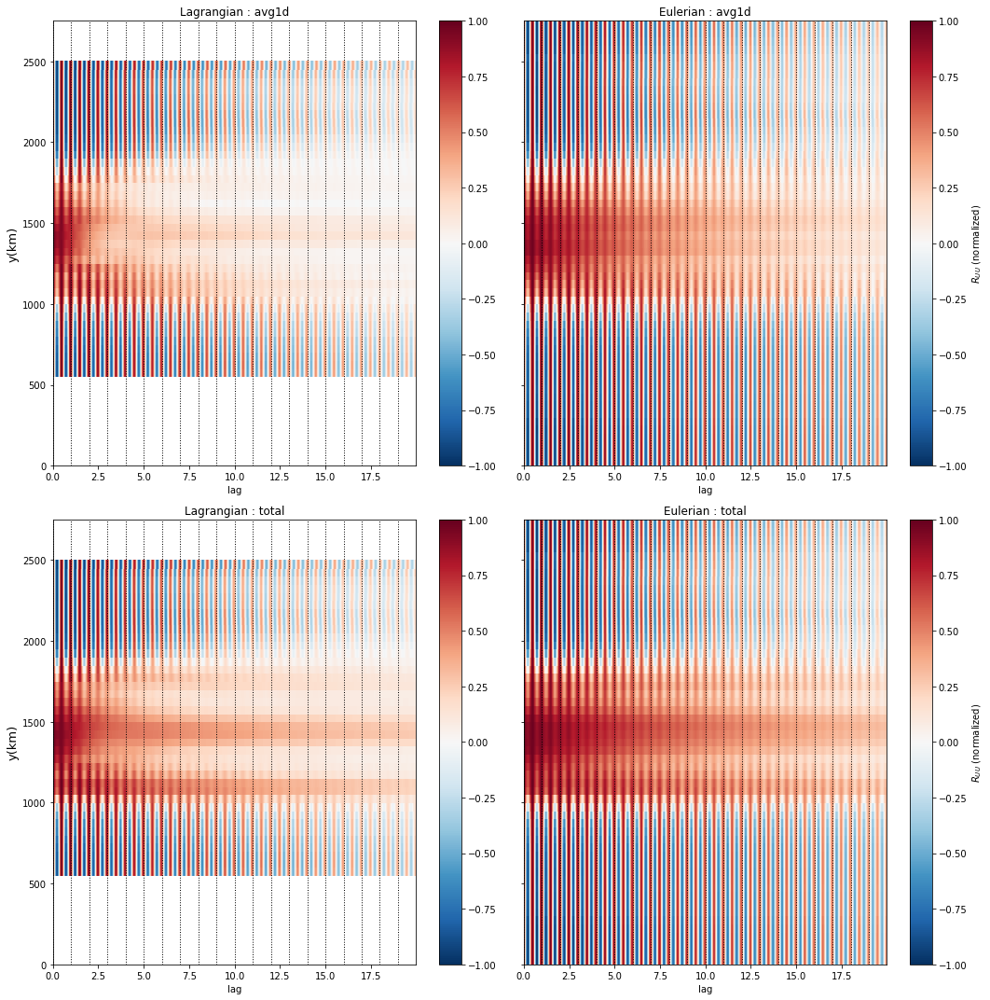

In [51]:
fig,ax = plt.subplots(2,2,figsize=(15,15))
for V,i in zip(['avg1d','total'],range(2)):
    corrL[V]['uu_normalized'].plot(ax=ax[i,0],cbar_kwargs={'label':''});ax[i,0].set_ylabel('')
    corrE[V]['uu_normalized'].plot(ax=ax[i,1],cbar_kwargs={'label':r'$R_{UU}$ (normalized)'});ax[i,1].set_ylabel('')
    [ax[i,0].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,20,2*0.5)]
    ax[i,0].set_title('Lagrangian : '+V);ax[i,0].set_ylabel('y(km)',fontsize=13)
    [ax[i,1].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,20,2*0.5)]
    ax[i,1].set_title('Eulerian : '+V);ax[i,1].set_yticklabels('')#;ax[i,1].set_ylabel('y(m)',fontsize=15)
fig.tight_layout()
#    ax[i,1].set_xlim(0,10);ax[i,0].set_xlim(0,10)

#### Comments/notes : 
Lagragian and eulerian normalized autocorrelation of u computed using the signal minus the average eulerian field (first line) and the total signal (second line).\
Only difference right in the jet, with slower decay with the whole signal

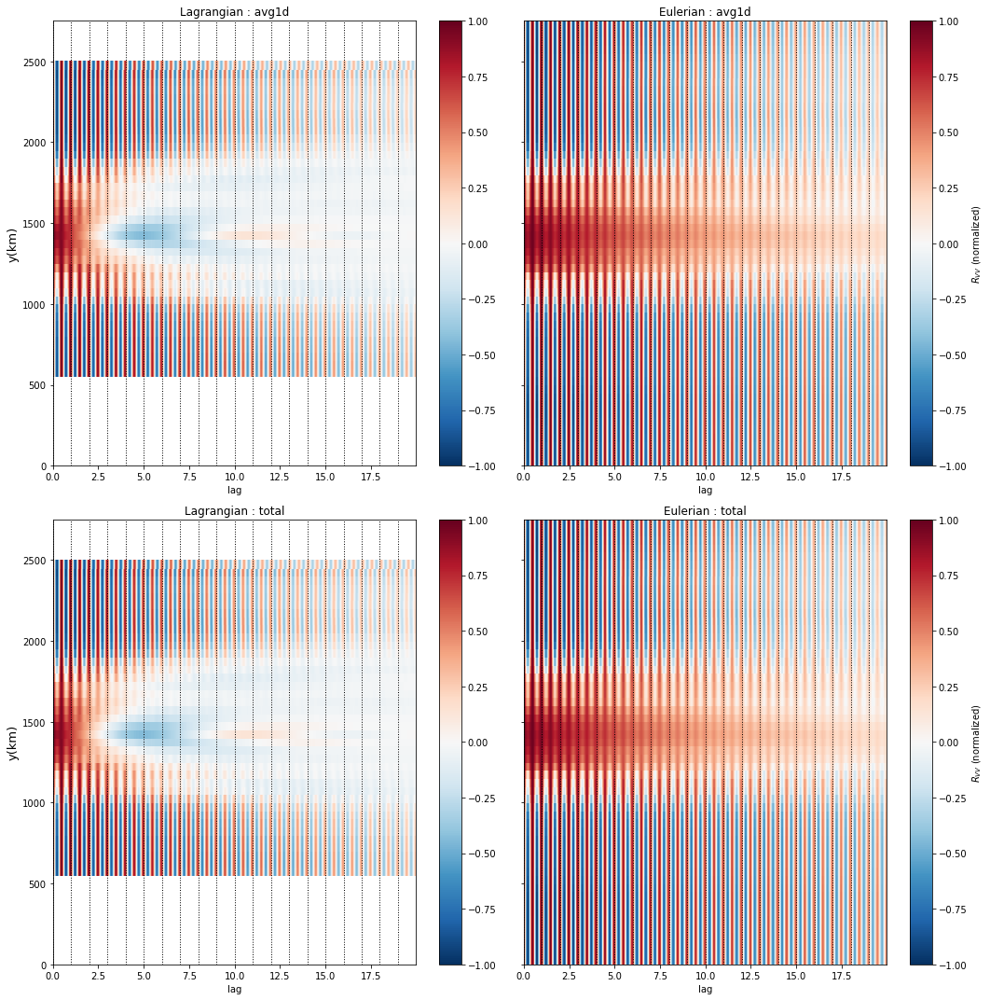

In [52]:
fig,ax = plt.subplots(2,2,figsize=(15,15))
for V,i in zip(['avg1d','total'],range(2)):
    corrL[V]['vv_normalized'].plot(ax=ax[i,0],cbar_kwargs={'label':''});ax[i,0].set_ylabel('')
    corrE[V]['vv_normalized'].plot(ax=ax[i,1],cbar_kwargs={'label':r'$R_{VV}$ (normalized)'});ax[i,1].set_ylabel('')
    [ax[i,0].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,20,2*0.5)]
    ax[i,0].set_title('Lagrangian : '+V);ax[i,0].set_ylabel('y(km)',fontsize=13)
    [ax[i,1].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,20,2*0.5)]
    ax[i,1].set_title('Eulerian : '+V);ax[i,1].set_yticklabels('')#;ax[i,1].set_ylabel('y(m)',fontsize=15)
fig.tight_layout()

#### Comments/notes : 
No differences this between the two lines, very low mean v in the entire domain.

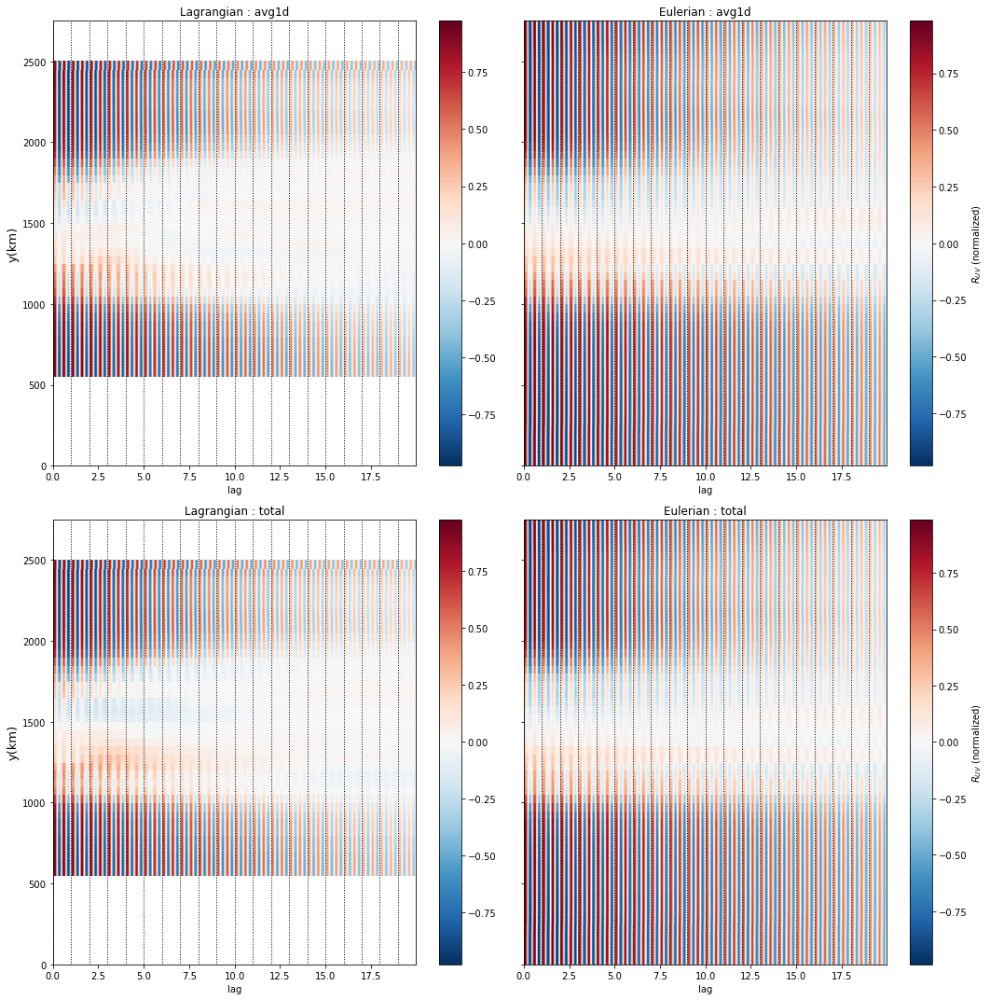

In [53]:
fig,ax = plt.subplots(2,2,figsize=(15,15))
for V,i in zip(['avg1d','total'],range(2)):
    corrL[V]['uv_normalized'].plot(ax=ax[i,0],cbar_kwargs={'label':''});ax[i,0].set_ylabel('')
    corrE[V]['uv_normalized'].plot(ax=ax[i,1],cbar_kwargs={'label':r'$R_{UV}$ (normalized)'});ax[i,1].set_ylabel('')
    [ax[i,0].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,20,2*0.5)]
    ax[i,0].set_title('Lagrangian : '+V);ax[i,0].set_ylabel('y(km)',fontsize=13)
    [ax[i,1].axvline(x,linestyle='dotted',color='k',linewidth=1) for x in np.arange(0,20,2*0.5)]
    ax[i,1].set_title('Eulerian : '+V);ax[i,1].set_yticklabels('')#;ax[i,1].set_ylabel('y(m)',fontsize=15)
fig.tight_layout()

### Fit

$\widetilde{C} = \widetilde{X}cos(\omega\tau)e^{-\tau/\tilde{T}}$\
$\overline{C} = \overline{X}cos(\Omega\tau)e^{-\tau/\bar{T}}$\
$C = \widetilde{C}+\overline{C}$

In [28]:
om = 2 # tidal frequency (M2)
# Fast contribution
def Ctilde(t,Tt):
    return np.exp(-t/Tt)*np.cos(2*np.pi*om*t)#*np.cos(2*np.pi*nu*t)
#Slow contribution
def Cbar(t,Tb):
    return np.exp(-t/Tb)#*np.cos(2*np.pi*Om*t)
#Total formula
def C(t,Tt,Xtilde,Tb,Xbar):
    return Xbar*Cbar(t,Tb)+Xtilde*Ctilde(t,Tt)

In [16]:
def fit(t,y,myfunc,bounds,norm=False): 
    """Compute the best fit parameters found using scipy.optimize.curve_fit
        Parameters
        ----------
        t : timelag of the correlation function
        y : data to fit
        myfunc : function we want to fit to our data, y
        bounds : bounds of the parameters to fit 
        
        Returns
        ----------
        yfit : best fit
        params : parameters for which we obtain the best fit
        cov : covariance of params computed in scipy.optimize.curve_fit
        """
    sig = signature(myfunc)
    if norm:
        y = y/y.sel(lag=0)
    if np.isnan(y).any()==True:
        yfit = np.full_like(y,np.nan)
        params=np.full(len([V for V in sig.parameters.keys()][1:]),np.nan)
        cov = np.full((len([V for V in sig.parameters.keys()][1:]),len([V for V in sig.parameters.keys()][1:])),np.nan)
        yfit = xr.DataArray(np.full(y.lag.size,np.nan))
    else : 
        params,cov = scipy.optimize.curve_fit(myfunc,t,y,bounds=bounds)#,sigma=weights,absolute_sigma=True)
        yfit = myfunc(t,*[p for p in params])
    out = xr.Dataset({'params':(['ybin','param'],np.expand_dims(params, axis=0)),
                      'fitted':(['ybin','lags'],np.expand_dims(yfit.values,axis=0))},
                     coords={'ybin':np.array([y.y_bins.values]),'param':[V for V in sig.parameters.keys()][1:],
                             'lags':y.lag.values})
    return out#yfit,params,cov

In [35]:
from inspect import signature
import scipy


# Parameters
myfunc = C #function to use for the fit
bounds = ((1,0,0,0),(1000,np.inf,1000,np.inf)) # bounds for the fit to avoid non physical results
ce,cl = 'lightseagreen','firebrick'

In [36]:
out_combL_avg,out_combE_avg = {},{}
for V in ['uu','vv'] :
    out_combL_avg[V] = xr.concat([fit(corrL['avg1d'][V].lag,corrL['avg1d'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrL['avg1d'][V].y_bins],dim='ybin')
    out_combE_avg[V] = xr.concat([fit(corrE['avg1d'][V].lag,corrE['avg1d'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['avg1d'][V].y_bins],dim='ybin')

    out_combE_avg[V] = out_combE_avg[V].assign_coords({'ybin':out_combE_avg[V].ybin.values*1e-3})


    out_combE_avg[V+'_normalized'] = out_combE_avg[V].fitted/out_combE_avg[V].fitted.sel(lags=0)
    out_combL_avg[V+'_normalized'] = out_combL_avg[V].fitted/out_combL_avg[V].fitted.sel(lags=0)

RuntimeError: Optimal parameters not found: The maximum number of function evaluations is exceeded.

In [58]:
out_combL,out_combE = {},{}
for V in ['uu','vv'] :
    out_combL[V] = xr.concat([fit(corrL['total'][V].lag,corrL['total'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrL['total'][V].y_bins],dim='ybin')
    out_combE[V] = xr.concat([fit(corrE['total'][V].lag,corrE['total'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['total'][V].y_bins],dim='ybin')
    out_combE[V] = out_combE[V].assign_coords({'ybin':out_combE[V].ybin.values*1e-3})
    out_combE[V+'_normalized'] = out_combE[V].fitted/out_combE[V].fitted.sel(lags=0)
    out_combL[V+'_normalized'] = out_combL[V].fitted/out_combL[V].fitted.sel(lags=0)

### Fig 6 : Lagrangian and eulerian autocorrelation at 3 three ybins and the corresponding best fit found

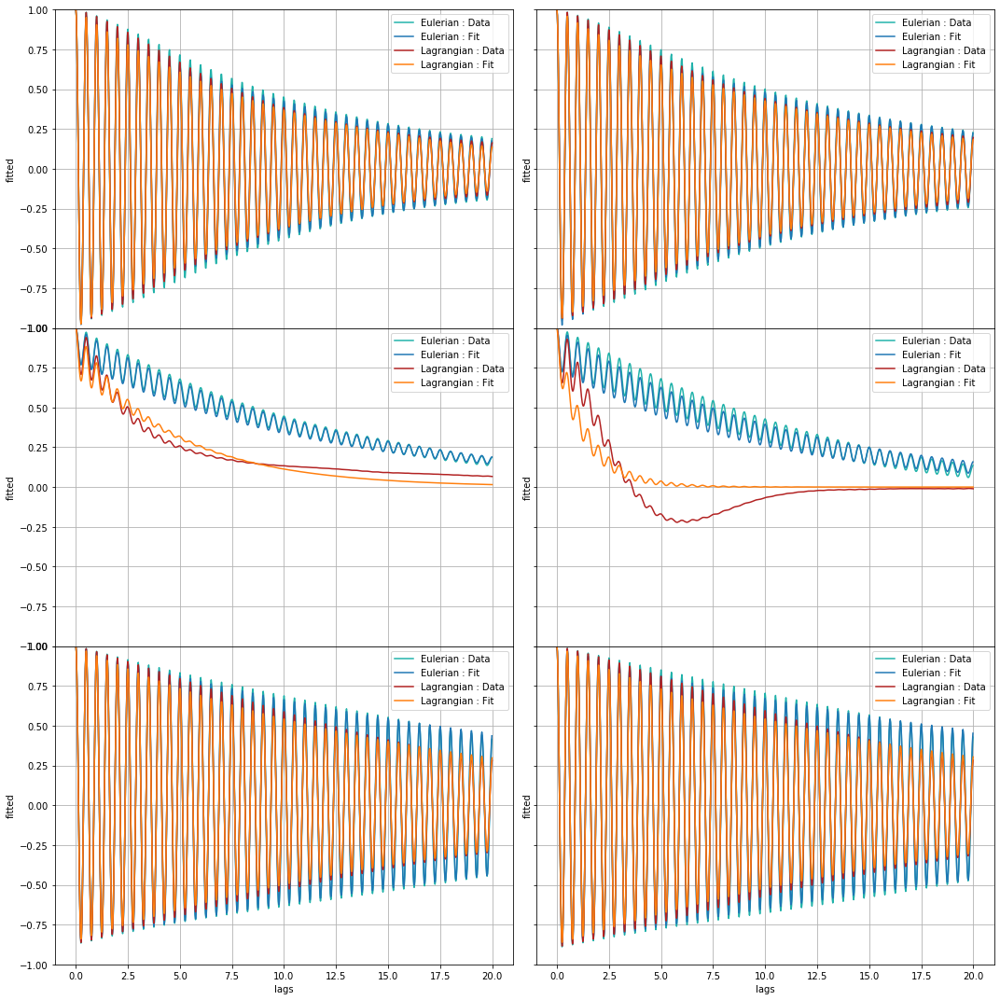

In [59]:
#Sections
Y=[2300,1500,700]
fig,axs = plt.subplots(3,2,figsize=(15,15),sharex=True, sharey=True,gridspec_kw={'hspace': 0})
for i,y in enumerate(Y):
    for V,ax in zip(['uu','vv'],axs[i,:]):
        corrE['avg1d'][V+'_normalized'].sel(y_bins=y*1e3,method='nearest').plot(c=ce,ax=ax,label=('Eulerian : Data'))
        out_combE_avg[V+'_normalized'].sel(ybin=y,method='nearest').plot(ax=ax,label=('Eulerian : Fit'))
        corrL['avg1d'][V+'_normalized'].sel(y_bins=y,method='nearest').plot(c=cl,ax=ax,label=('Lagrangian : Data'))
        out_combL_avg[V+'_normalized'].sel(ybin=y,method='nearest').plot(ax=ax,label=('Lagrangian : Fit'))
        ax.set_ylim(-1,1);ax.grid();ax.legend();ax.set_title('')
    #axs[0].text(-4,0,name,fontsize=20,rotation=90)
    #axs[0].set_title('uu');axs[1].set_title('vv')#;axs[0,2].set_title('uv');axs[0,3].set_title('vu')
    #plt.suptitle(title,x=.55,y=1,fontsize=20)
    fig.tight_layout()

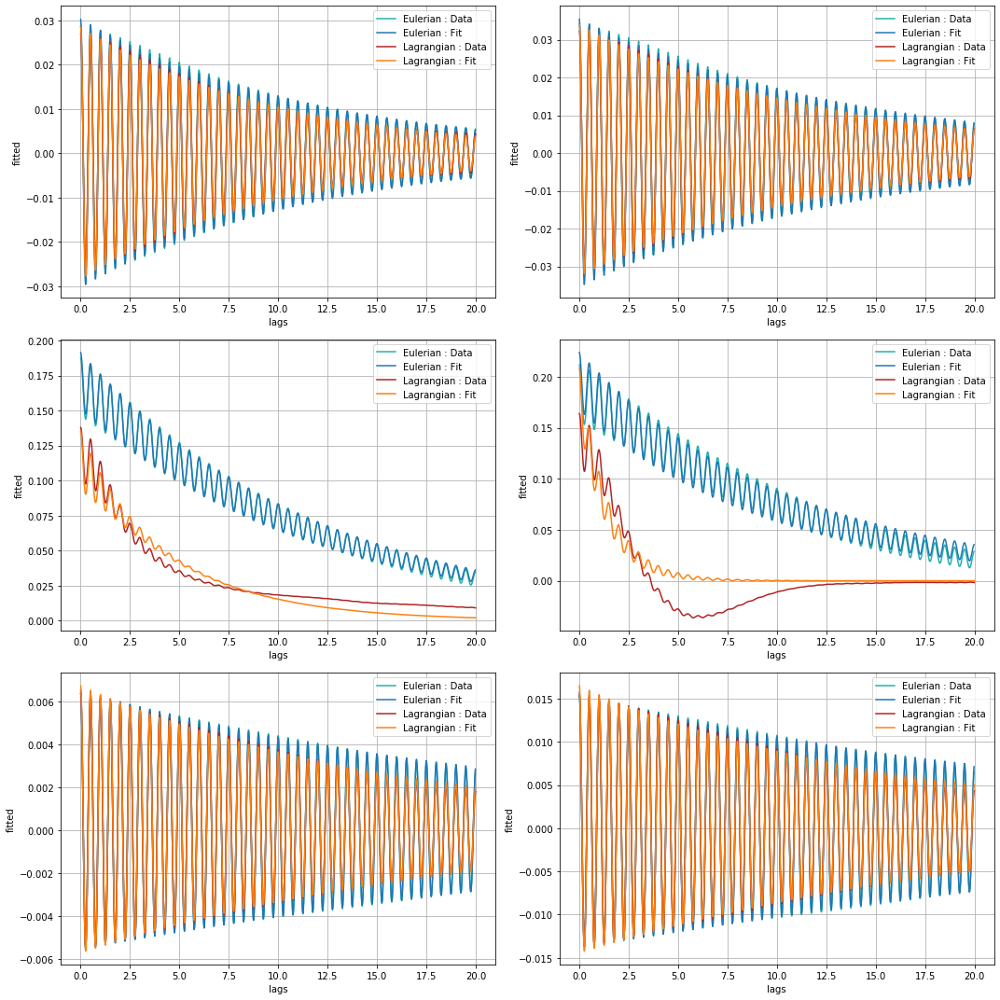

In [60]:
#Sections
Y=[2300,1500,700]
fig,axs = plt.subplots(3,2,figsize=(15,15))
for i,y in enumerate(Y):
    for V,ax in zip(['uu','vv'],axs[i,:]):
        corrE['avg1d'][V].sel(y_bins=y*1e3,method='nearest').plot(c=ce,ax=ax,label=('Eulerian : Data'))
        out_combE_avg[V].fitted.sel(ybin=y,method='nearest').plot(ax=ax,label=('Eulerian : Fit'))
        corrL['avg1d'][V].sel(y_bins=y,method='nearest').plot(c=cl,ax=ax,label=('Lagrangian : Data'))
        out_combL_avg[V].fitted.sel(ybin=y,method='nearest').plot(ax=ax,label=('Lagrangian : Fit'))
        ax.grid();ax.legend();ax.set_title('');
    #axs[0].text(-4,0,name,fontsize=20,rotation=90)
    #axs[0].set_title('uu');axs[1].set_title('vv')#;axs[0,2].set_title('uv');axs[0,3].set_title('vu')
    #plt.suptitle(title,x=.55,y=1,fontsize=20)
    fig.tight_layout()

#### Comments/notes : 
Same figure that previous one but with non normalized autocorrelation (choose btw the 2)

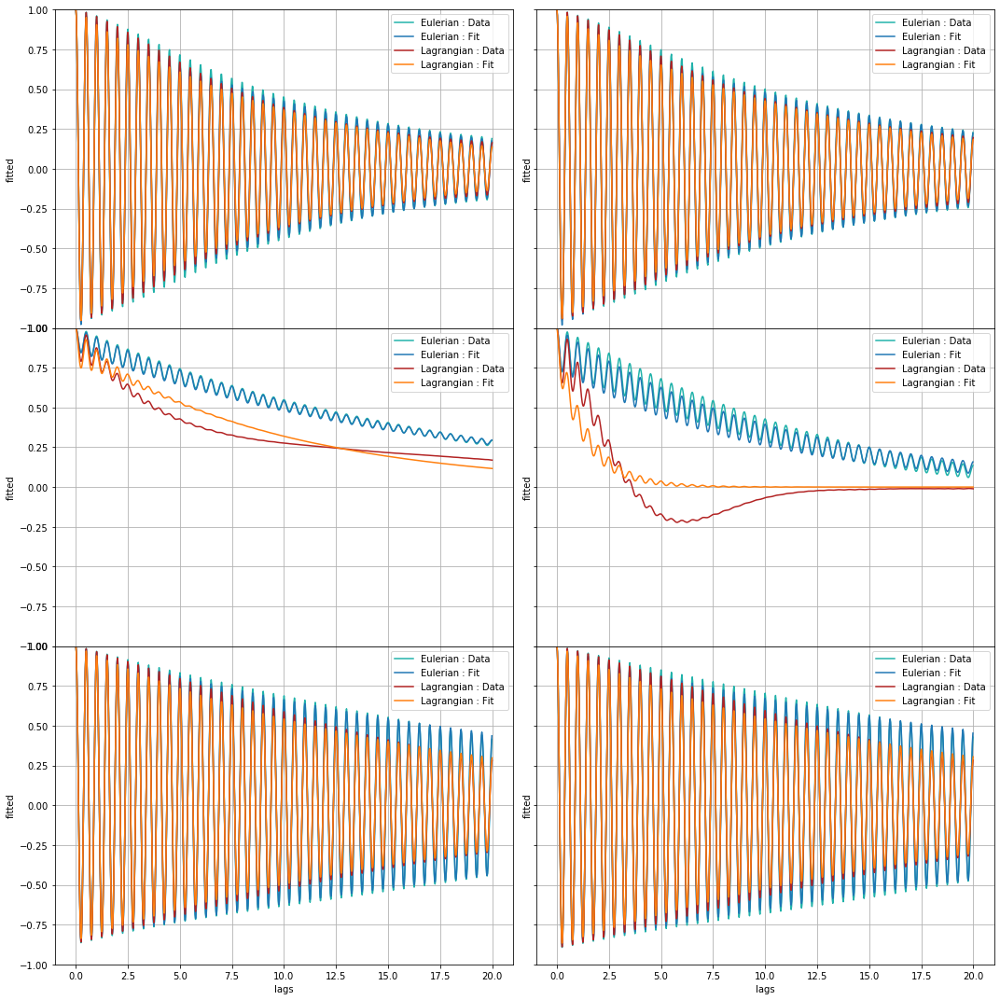

In [61]:
#Sections
Y=[2300,1500,700]
fig,axs = plt.subplots(3,2,figsize=(15,15),sharex=True, sharey=True,gridspec_kw={'hspace': 0})
for i,y in enumerate(Y):
    for V,ax in zip(['uu','vv'],axs[i,:]):
        corrE['total'][V+'_normalized'].sel(y_bins=y*1e3,method='nearest').plot(c=ce,ax=ax,label=('Eulerian : Data'))
        out_combE[V+'_normalized'].sel(ybin=y,method='nearest').plot(ax=ax,label=('Eulerian : Fit'))
        corrL['total'][V+'_normalized'].sel(y_bins=y,method='nearest').plot(c=cl,ax=ax,label=('Lagrangian : Data'))
        out_combL[V+'_normalized'].sel(ybin=y,method='nearest').plot(ax=ax,label=('Lagrangian : Fit'))
        ax.set_ylim(-1,1);ax.grid();ax.legend();ax.set_title('')
    #axs[0].text(-4,0,name,fontsize=20,rotation=90)
    #axs[0].set_title('uu');axs[1].set_title('vv')#;axs[0,2].set_title('uv');axs[0,3].set_title('vu')
    #plt.suptitle(title,x=.55,y=1,fontsize=20)
    fig.tight_layout()

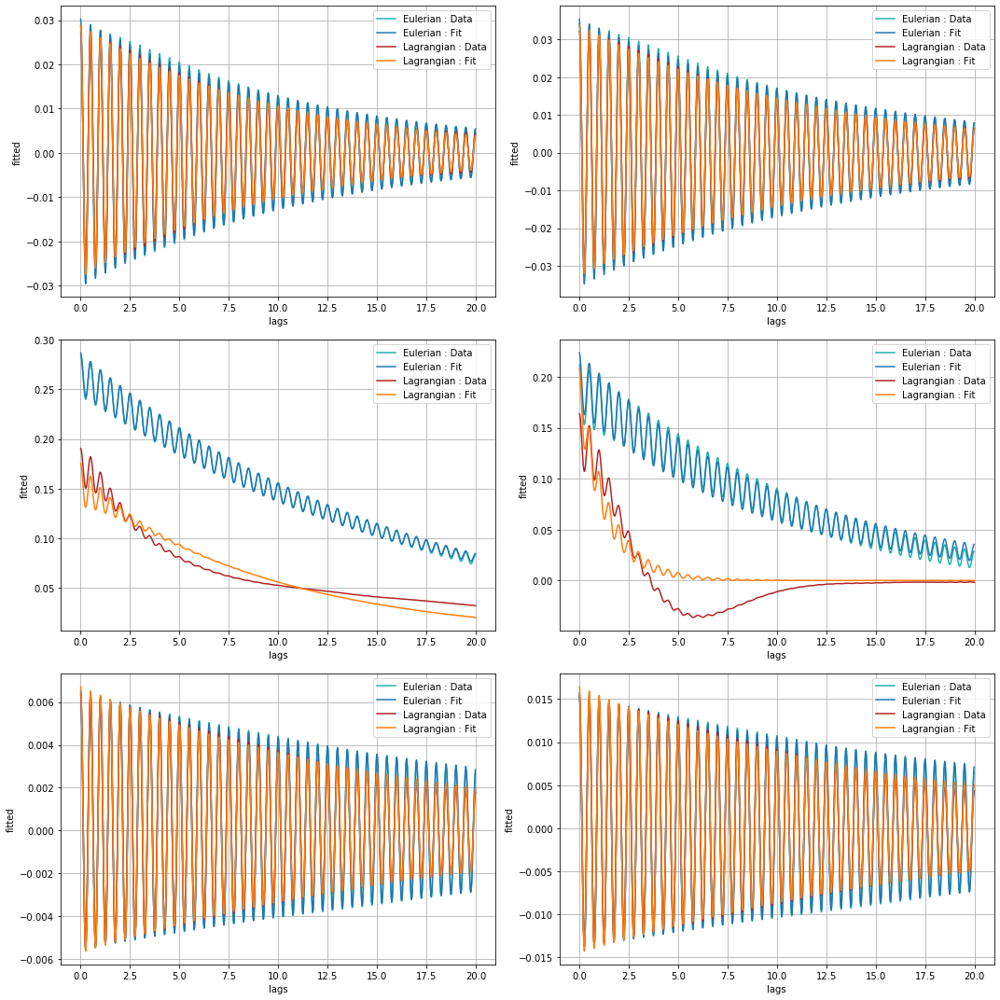

In [62]:
#Sections
Y=[2300,1500,700]
fig,axs = plt.subplots(3,2,figsize=(15,15))
for i,y in enumerate(Y):
    for V,ax in zip(['uu','vv'],axs[i,:]):
        corrE['total'][V].sel(y_bins=y*1e3,method='nearest').plot(c=ce,ax=ax,label=('Eulerian : Data'))
        out_combE[V].fitted.sel(ybin=y,method='nearest').plot(ax=ax,label=('Eulerian : Fit'))
        corrL['total'][V].sel(y_bins=y,method='nearest').plot(c=cl,ax=ax,label=('Lagrangian : Data'))
        out_combL[V].fitted.sel(ybin=y,method='nearest').plot(ax=ax,label=('Lagrangian : Fit'))
        ax.grid();ax.legend();ax.set_title('');
    #axs[0].text(-4,0,name,fontsize=20,rotation=90)
    #axs[0].set_title('uu');axs[1].set_title('vv')#;axs[0,2].set_title('uv');axs[0,3].set_title('vu')
    #plt.suptitle(title,x=.55,y=1,fontsize=20)
    fig.tight_layout()

### Fig 7 : Estimation of the parameters depending on y

In [31]:
lims_uu = [(0,30),(0,0.1),(0,25),(0,0.5)]#,(-0.01,0.05)]
lims_vv = [(0,30),(0,0.1),(0,25),(0,0.7)]#,(-0.01,0.07)]
titles = [r'$\widetilde{T}$',r'$\widetilde{X}$',r'$\overline{T}$',r'$\overline{X}$']#,r'$\Omega$']

KeyError: 'uu'

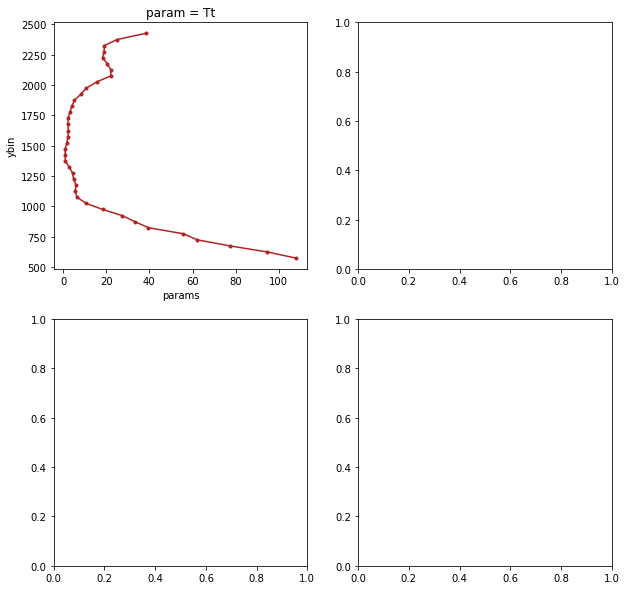

In [32]:
fig,axes = plt.subplots(2,2,figsize=(10,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_uu[:2],axes[0,:]):
    out_combL_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar'],titles[2:],lims_uu[2:],axes[1,:]):
    out_combL_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['uu'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of u')

Text(0.5, 0.98, 'Autocorrelation of v')

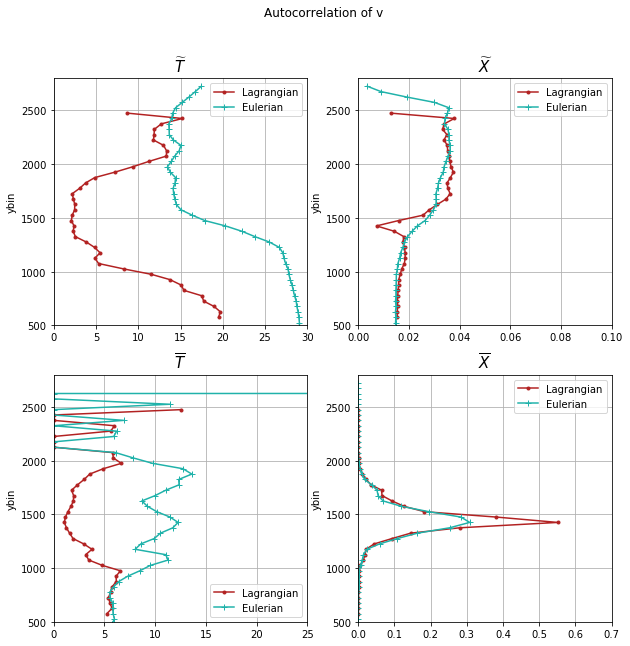

In [65]:
fig,axes = plt.subplots(2,2,figsize=(10,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_vv[:2],axes[0,:]):
    out_combL_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar'],titles[2:],lims_vv[2:],axes[1,:]):
    out_combL_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['vv'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of v')

Text(0.5, 0.98, 'Autocorrelation of u')

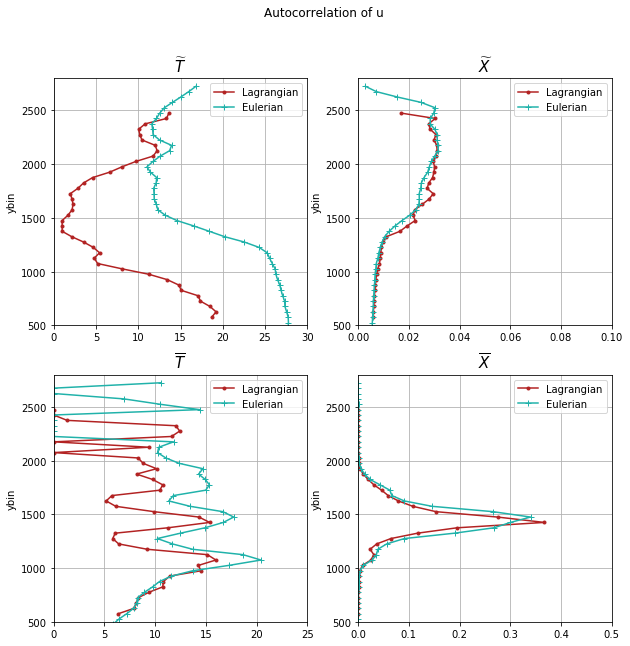

In [66]:
fig,axes = plt.subplots(2,2,figsize=(10,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_uu[:2],axes[0,:]):
    out_combL['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar'],titles[2:],lims_uu[2:],axes[1,:]):
    out_combL['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['uu'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of u')

Text(0.5, 0.98, 'Autocorrelation of v')

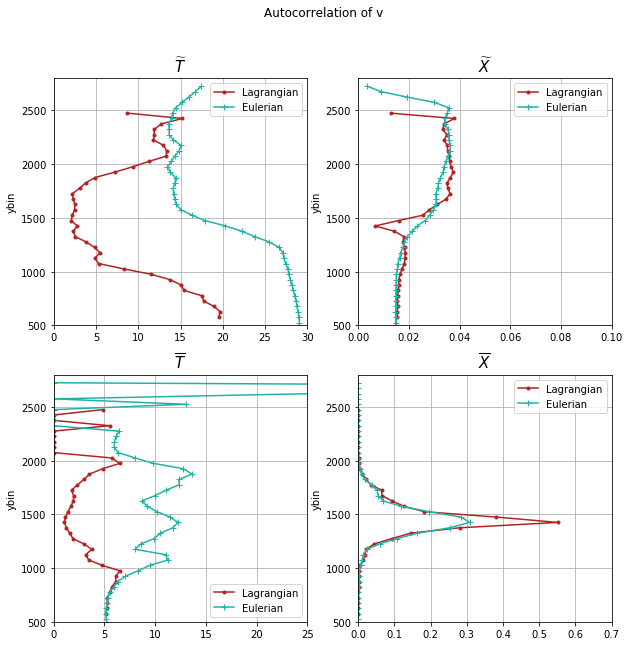

In [67]:
fig,axes = plt.subplots(2,2,figsize=(10,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_vv[:2],axes[0,:]):
    out_combL['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar'],titles[2:],lims_vv[2:],axes[1,:]):
    out_combL['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['vv'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of v')

### With $\Omega$

In [17]:
om = 2 # tidal frequency (M2)
# Fast contribution
def Ctilde(t,Tt):
    return np.exp(-t/Tt)*np.cos(2*np.pi*om*t)#*np.cos(2*np.pi*nu*t)
#Slow contribution
def Cbar(t,Tb,Om):
    return np.exp(-t/Tb)*np.cos(2*np.pi*Om*t)
#Total formula
def C(t,Tt,Xtilde,Tb,Xbar,Omega):
    return Xbar*Cbar(t,Tb,Omega)+Xtilde*Ctilde(t,Tt)

In [18]:
from inspect import signature
import scipy


# Parameters
myfunc = C #function to use for the fit
bounds = ((1,0,0,0,0),(2000,np.inf,2000,np.inf,1)) # bounds for the fit to avoid non physical results
ce,cl = 'lightseagreen','firebrick'

In [19]:
out_combL_avg,out_combE_avg = {},{}
for V in ['uu','vv'] :
    out_combL_avg[V] = xr.concat([fit(corrL['avg1d'][V].lag,
                                      corrL['avg1d'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrL['avg1d'][V].y_bins],dim='ybin')
    out_combE_avg[V] = xr.concat([fit(corrE['avg1d'][V].lag,
                                      corrE['avg1d'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['avg1d'][V].y_bins],dim='ybin')

    out_combE_avg[V] = out_combE_avg[V].assign_coords({'ybin':out_combE_avg[V].ybin.values*1e-3})
    out_combE_avg[V+'_normalized'] = out_combE_avg[V].fitted/out_combE_avg[V].fitted.sel(lags=0)
    out_combL_avg[V+'_normalized'] = out_combL_avg[V].fitted/out_combL_avg[V].fitted.sel(lags=0)

In [ ]:
out_combL,out_combE = {},{}
for V in ['uu','vv'] :
    out_combL[V] = xr.concat([fit(corrL['total'][V].lag,corrL['total'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrL['total'][V].y_bins],dim='ybin')
    out_combE[V] = xr.concat([fit(corrE['total'][V].lag,corrE['total'][V].sel(y_bins=Y,method='nearest'),
                              myfunc,bounds,False) for Y in corrE['total'][V].y_bins],dim='ybin')
    out_combE[V] = out_combE[V].assign_coords({'ybin':out_combE[V].ybin.values*1e-3})
    out_combE[V+'_normalized'] = out_combE[V].fitted/out_combE[V].fitted.sel(lags=0)
    out_combL[V+'_normalized'] = out_combL[V].fitted/out_combL[V].fitted.sel(lags=0)

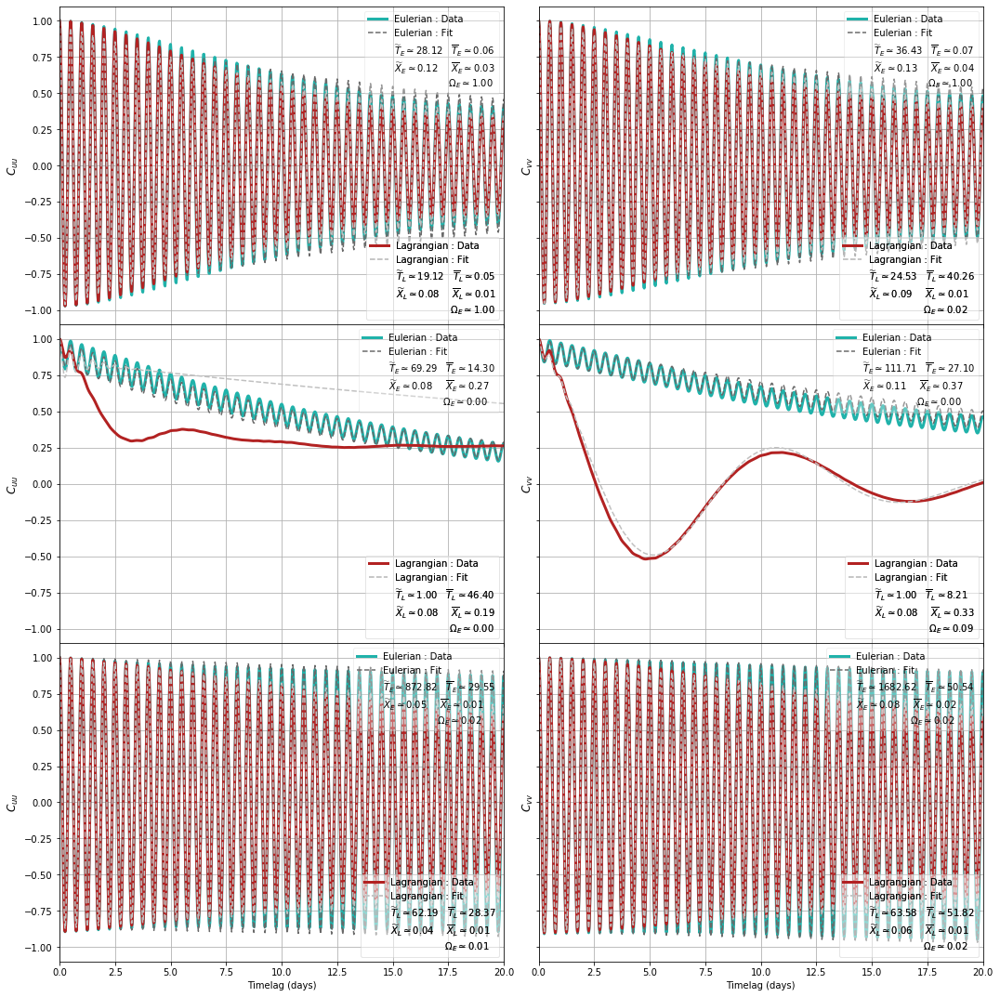

In [46]:
import matplotlib as mpl
from matplotlib.patches import Rectangle

ce_fit = 'dimgrey'
cl_fit='silver'
#Sections
Y=[2300,1425,700]

props = dict(boxstyle='round', facecolor='w', alpha=0.5)

# place a text box in upper left in axes coords


fig,axs = plt.subplots(3,2,figsize=(15,15),sharex=True, sharey=True,gridspec_kw={'hspace': 0})
for i,y in enumerate(Y):
    for V,ax in zip(['uu','vv'],axs[i,:]):
        paE = out_combE_avg[V].sel(ybin=y,method='nearest').params.values
        paL = out_combL_avg[V].sel(ybin=y,method='nearest').params.values
        textstrE = '\n'.join((
            r'$\widetilde{T}_E\simeq%.2f\hspace{1}\overline{T}_E\simeq%.2f$' % (paE[0], paE[2]),
            r'$\widetilde{X}_E\simeq%.2f\hspace{1.5}\overline{X}_E\simeq%.2f$' % (np.sqrt(paE[1]),np.sqrt(paE[3])),
            r'$\hspace{6}\Omega_E\simeq%.2f$'% (paE[4],)
                            ))
        textstrL = '\n'.join((
            r'$\widetilde{T}_L\simeq%.2f\hspace{1}\overline{T}_L\simeq%.2f$' % (paL[0], paL[2]),
            r'$\widetilde{X}_L\simeq%.2f\hspace{1.5}\overline{X}_L\simeq%.2f$' % (np.sqrt(paL[1]),np.sqrt(paL[3])),
            r'$\hspace{6}\Omega_E\simeq%.2f$'% (paL[4],)
                            ))
        corrE['avg1d'][V+'_normalized'].sel(y_bins=y*1e3,method='nearest').plot(c=ce,linewidth = 3,ax=ax,label=('Eulerian : Data'))
        out_combE_avg[V+'_normalized'].sel(ybin=y,method='nearest').plot(c = ce_fit,linestyle='--',ax=ax,label=('Eulerian : Fit'))
        corrL['avg1d'][V+'_normalized'].sel(y_bins=y,method='nearest').plot(c=cl,linewidth = 3,ax=ax,label=('Lagrangian : Data'))
        out_combL_avg[V+'_normalized'].sel(ybin=y,method='nearest').plot(c=cl_fit,linestyle='--',ax=ax,label=('Lagrangian : Fit'))
        handles,labels = ax.get_legend_handles_labels()
        extra = Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0)
        legendE = ax.legend(handles[:2]+[extra],labels[:2]+[textstrE],loc='upper right',framealpha=0.3);
        ax.add_artist(legendE)
        legendL = ax.legend(handles[2:]+[extra],labels[2:]+[textstrL],loc='lower right',framealpha=0.3)
        ax.add_artist(legendL)
        ax.set_ylim(-1.1,1.1);ax.grid();ax.set_title('')
        ax.set_ylabel(r'$C_{%s}$'%V,fontsize=12);ax.set_xlabel('Timelag (days)')
        ax.set_xlim(0,20)
    fig.tight_layout()
    fig.savefig('/home1/datawork/zcaspar/Fig_paper/sections_fit.pdf')

In [47]:
lims_uu = [(0,60),(0,0.02),(0,25),(0,0.1),(-0.01,0.05)]
lims_vv = [(0,60),(0,0.02),(0,25),(0,0.1),(-0.01,0.1)]
titles = [r'$\widetilde{T}$',r'$\widetilde{X}$',r'$\overline{T}$',r'$\overline{X}$',r'$\Omega$']

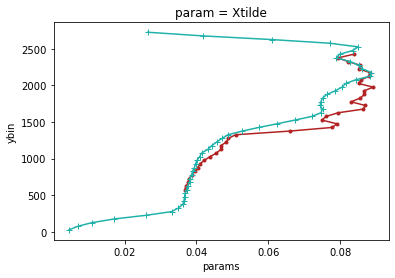

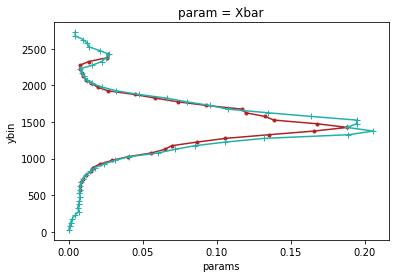

In [50]:
np.sqrt(out_combL_avg['uu'].params.sel(param='Xtilde')).plot(y='ybin',c=cl,marker='.')#,label=r'Lagrangian $\widetilde{'+pa[0]+'}_u$')
np.sqrt(out_combE_avg['uu'].params.sel(param='Xtilde')/2).plot(y='ybin',c=ce,marker='+')#,label=r'Eulerian $\widetilde{'+pa[0]+'}_u$')
plt.figure()
np.sqrt(out_combL_avg['uu'].params.sel(param='Xbar')).plot(y='ybin',c=cl,marker='.')#,label=r'Lagrangian $\widetilde{'+pa[0]+'}_u$')
np.sqrt(out_combE_avg['uu'].params.sel(param='Xbar')/2).plot(y='ybin',c=ce,marker='+')#,label=r'Eulerian $\widetilde{'+pa[0]+'}_u$')

In [51]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
concurrent.futures._base.CancelledError


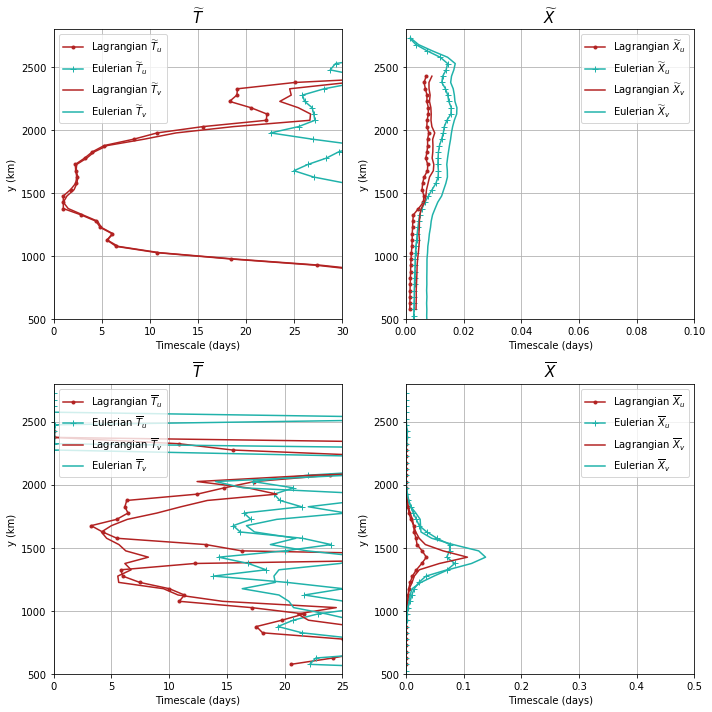

In [40]:
fig,axes = plt.subplots(2,2,figsize=(10,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_uu[:2],axes[0,:]):
    out_combL_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label=r'Lagrangian $\widetilde{'+pa[0]+'}_u$')
    out_combE_avg['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label=r'Eulerian $\widetilde{'+pa[0]+'}_u$')
    out_combL_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,label=r'Lagrangian $\widetilde{'+pa[0]+'}_v$')
    out_combE_avg['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,label=r'Eulerian $\widetilde{'+pa[0]+'}_v$')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
    ax.set_xlabel('Timescale (days)');ax.set_ylabel('y (km)')
for pa,title,lim,ax in zip(['Tb','Xbar'],titles[2:],lims_uu[2:],axes[1,:]):
    out_combL_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label=r'Lagrangian $\overline{'+pa[0]+'}_u$')
    out_combE_avg['uu'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label=r'Eulerian $\overline{'+pa[0]+'}_u$')
    out_combL_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,label=r'Lagrangian $\overline{'+pa[0]+'}_v$')
    out_combE_avg['vv'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,label=r'Eulerian $\overline{'+pa[0]+'}_v$')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('Timescale (days)')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15);ax.set_ylabel('y (km)')
fig.tight_layout()

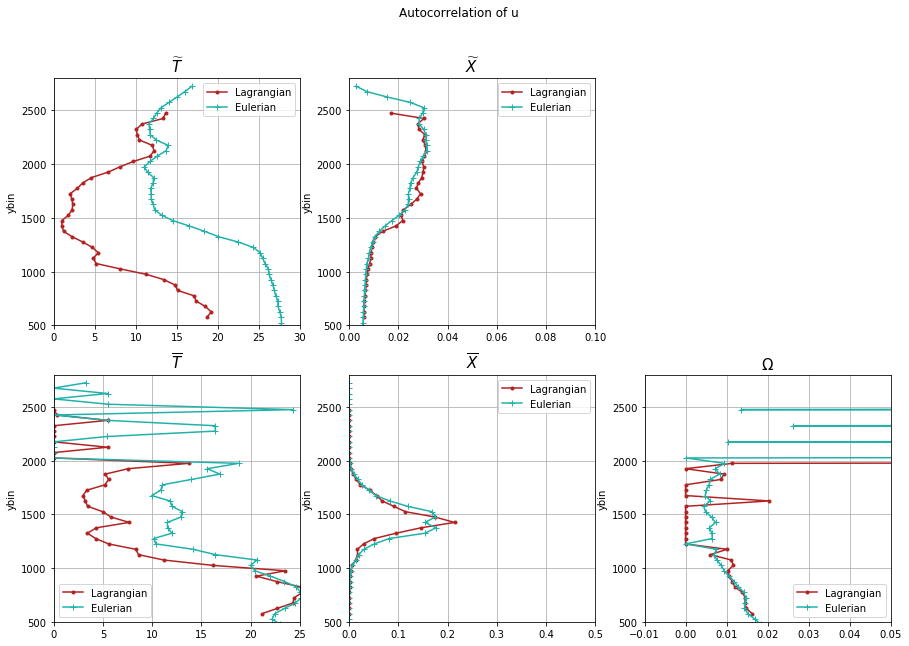

In [73]:
fig,axes = plt.subplots(2,3,figsize=(15,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_uu[:2],axes[0,:]):
    out_combL_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar','Omega'],titles[2:],lims_uu[2:],axes[1,:]):
    out_combL_avg['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['uu'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of u')
fig.delaxes(axes[0,2])

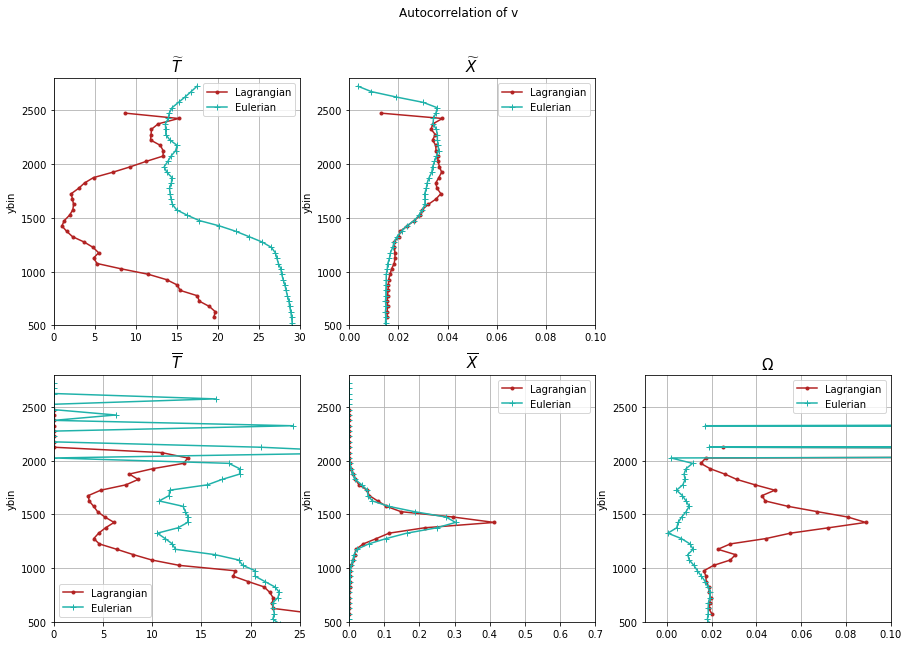

In [74]:
fig,axes = plt.subplots(2,3,figsize=(15,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_vv[:2],axes[0,:]):
    out_combL_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar','Omega'],titles[2:],lims_vv[2:],axes[1,:]):
    out_combL_avg['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg['vv'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of v')
fig.delaxes(axes[0,2])

### Sames figures but with the fit done on autocorrelation derived from the total signal

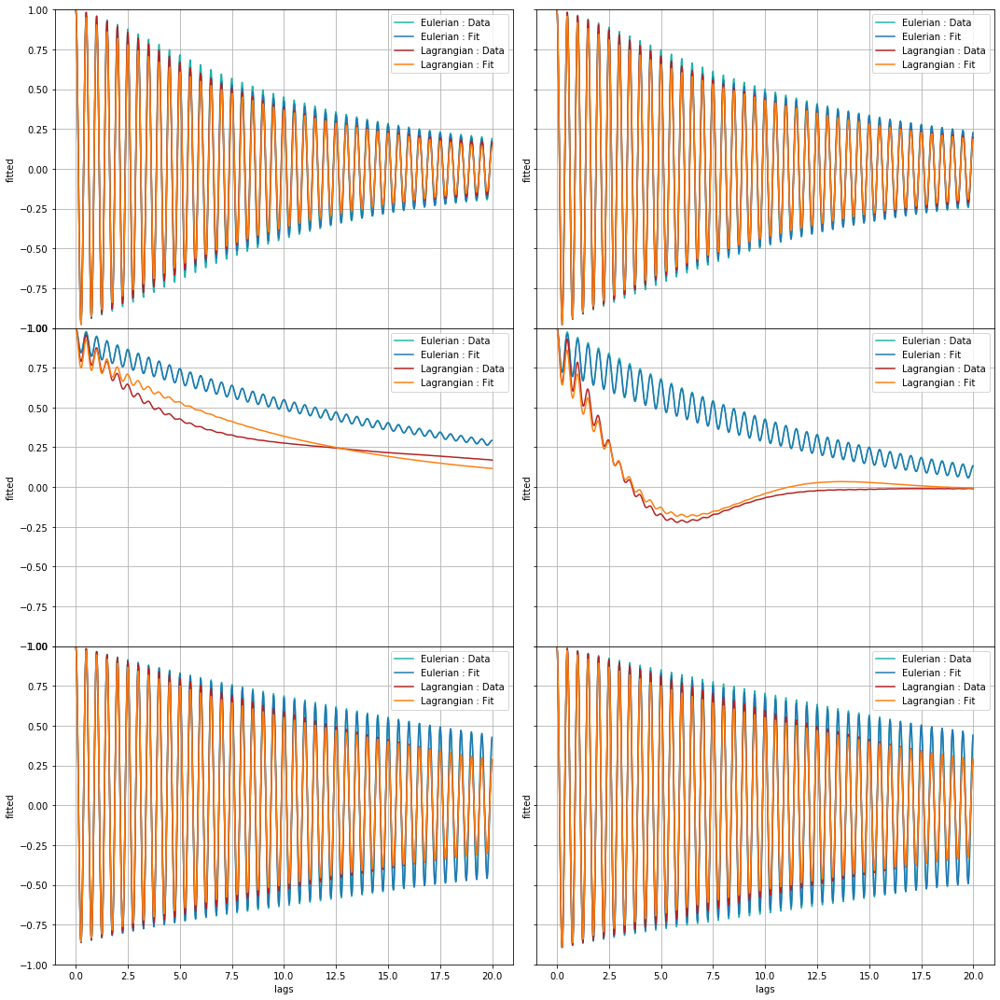

In [75]:
#Sections
Y=[2300,1500,700]
fig,axs = plt.subplots(3,2,figsize=(15,15),sharex=True, sharey=True,gridspec_kw={'hspace': 0})
for i,y in enumerate(Y):
    for V,ax in zip(['uu','vv'],axs[i,:]):
        corrE['total'][V+'_normalized'].sel(y_bins=y*1e3,method='nearest').plot(c=ce,ax=ax,label=('Eulerian : Data'))
        out_combE[V+'_normalized'].sel(ybin=y,method='nearest').plot(ax=ax,label=('Eulerian : Fit'))
        corrL['total'][V+'_normalized'].sel(y_bins=y,method='nearest').plot(c=cl,ax=ax,label=('Lagrangian : Data'))
        out_combL[V+'_normalized'].sel(ybin=y,method='nearest').plot(ax=ax,label=('Lagrangian : Fit'))
        ax.set_ylim(-1,1);ax.grid();ax.legend();ax.set_title('')
    #axs[0].text(-4,0,name,fontsize=20,rotation=90)
    #axs[0].set_title('uu');axs[1].set_title('vv')#;axs[0,2].set_title('uv');axs[0,3].set_title('vu')
    #plt.suptitle(title,x=.55,y=1,fontsize=20)
    fig.tight_layout()

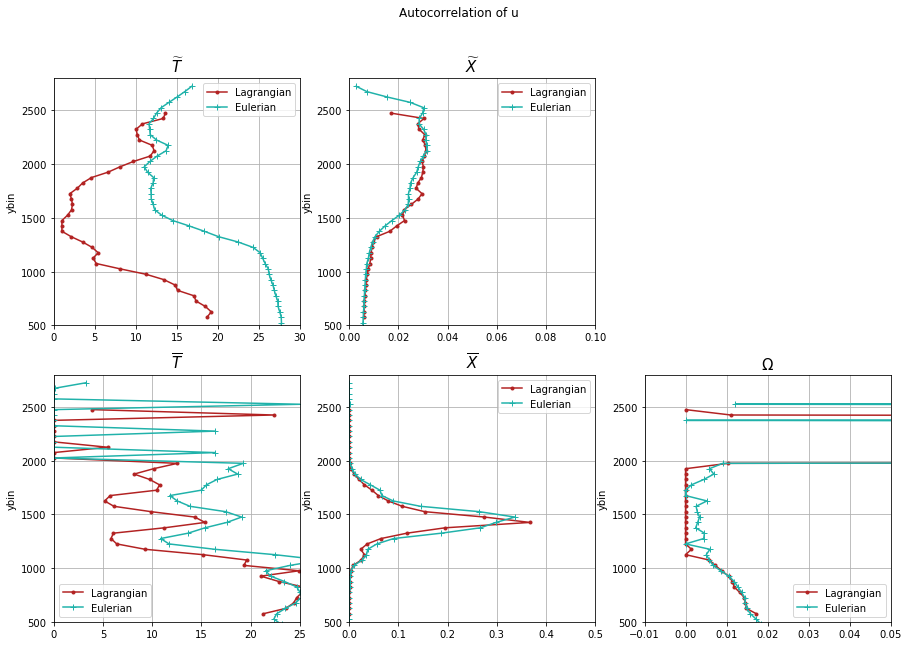

In [76]:
fig,axes = plt.subplots(2,3,figsize=(15,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_uu[:2],axes[0,:]):
    out_combL['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['uu'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar','Omega'],titles[2:],lims_uu[2:],axes[1,:]):
    out_combL['uu'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['uu'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of u')
fig.delaxes(axes[0,2])

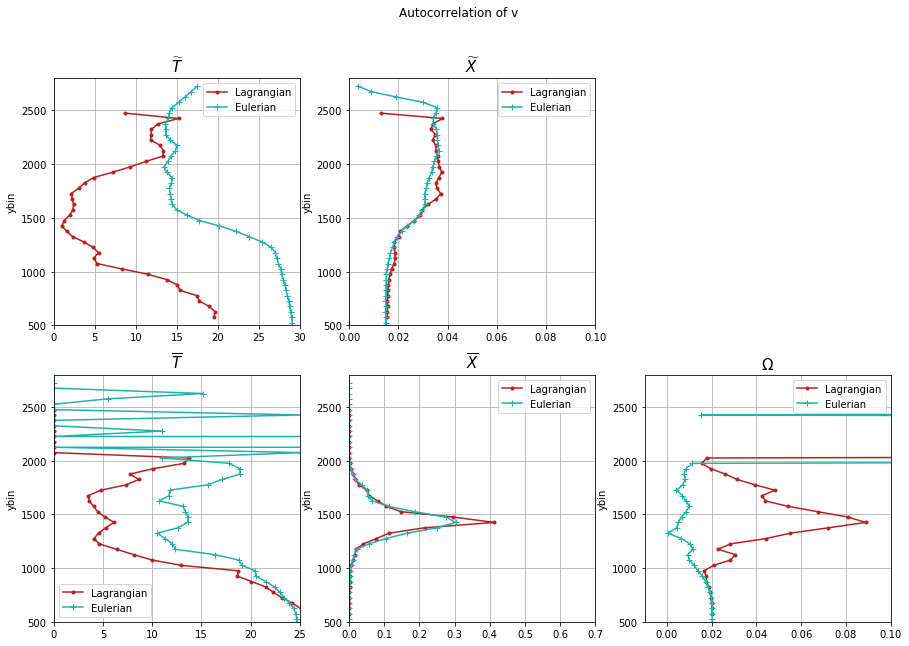

In [77]:
fig,axes = plt.subplots(2,3,figsize=(15,10))
for pa,title,lim,ax in zip(['Tt','Xtilde'],titles[:2],lims_vv[:2],axes[0,:]):
    out_combL['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['vv'].params.sel(param=pa).plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
for pa,title,lim,ax in zip(['Tb','Xbar','Omega'],titles[2:],lims_vv[2:],axes[1,:]):
    out_combL['vv'].params.sel(param=pa).plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE['vv'].params.sel(param=pa).plot(y='ybin', c=ce,ax=ax,marker='+',label='Eulerian')
    ax.set_ylim(500,2800);ax.set_xlim(lim);ax.set_xlabel('')
    ax.legend();ax.grid();ax.set_title(title,fontsize=15)
fig.suptitle('Autocorrelation of v')
fig.delaxes(axes[0,2])

In [20]:
vmodes = xr.open_dataset(path+'ZC_waves_modes.nc').persist()

In [21]:
Lt = vmodes.lwave.sel(mode=1)
Lt = Lt.assign_coords({'y_bins' : Lt.y_rho*1e-3})
#Ubar = ds_a.KE.isel(s_rho=-1).mean(['time','x_rho']).compute()
#Ubar = Ubar.assign_coords({'y_bins' : Ubar.y_rho*1e-3})
#Urms = np.sqrt(ds_a['Mean'].isel(s_rho=-1)).compute()
#Urms = Urms.assign_coords({'y_bins' : Urms.y_rho*1e-3})
Uprms = np.sqrt(((ds_a.u_a-ds_a.u_a.mean(['time','x_rho']))**2+(ds_a.v_a-ds_a.v_a.mean(['time','x_rho']))**2)
                .mean(['time','x_rho']).isel(s_rho=-1)).compute()
Uprms = Uprms.assign_coords({'y_bins' : Uprms.y_rho*1e-3})
Uprime = np.sqrt((ds_a.u_a-ds_a.u_a.mean(['time','x_rho']))**2+(ds_a.v_a-ds_a.v_a.mean(['time','x_rho']))**2).mean(['time','x_rho']).isel(s_rho=-1).compute()
Uprime = Uprime.assign_coords({'y_bins' : Uprime.y_rho*1e-3})

#Lt_Ub = Lt*1e3/Ubar/(24*3600)
#Lt_Urms = Lt*1e3/Urms/(24*3600)
Lt_Uprime = Lt*1e3/Uprime/(24*3600)
Lt_Uprms = Lt*1e3/Uprms/(24*3600)
Lt_U = Lt*1e3/U_a/(24*3600)
Lt_V = Lt*1e3/V_a/(24*3600)

#Lt_Ub.name = 'LtUbar'
#Lt_Urms.name = 'LtUrms'
Lt_Uprime.name = 'LtUprime'
Lt_Uprms.name = 'LtUprms'
Lt_U.name = 'LtU'
Lt_V.name = 'LtV'

In [22]:
#Lt_Ub_mean = Lt_Ub.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()
#Lt_Urms_mean = Lt_Urms.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()
#Lt_Ub_mean = Lt_Ub_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_Ub_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})
#Lt_Urms_mean = Lt_Urms_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_Urms_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})
Lt_Uprime_mean = Lt_Uprime.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()
Lt_Uprms_mean = Lt_Uprms.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()
Lt_U_mean = Lt_U.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()
Lt_V_mean = Lt_V.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()

Lt_Uprime_mean = Lt_Uprime_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_Uprime_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})
Lt_Uprms_mean = Lt_Uprms_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_Uprms_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})
Lt_U_mean = Lt_U_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_U_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})

Lt_V_mean = Lt_V_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_V_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})

In [47]:
KE_tst = tst.mean(['time','x_rho']).compute()
Lt_Uprime = Lt*1e3/KE_tst/(24*3600)
Lt_Uprime.name = 'LtUprime'
Lt_Uprime_mean = Lt_Uprime.groupby_bins('y_bins',out_combE_avg['uu'].ybin+25,include_lowest=False).mean()
Lt_Uprime_mean = Lt_Uprime_mean.assign_coords({'y_bins_bins':[yy.mid for yy in Lt_Uprime_mean.y_bins_bins.values]}).rename({'y_bins_bins':'ybin'})


Text(0.5, 0.98, 'Avg removed')

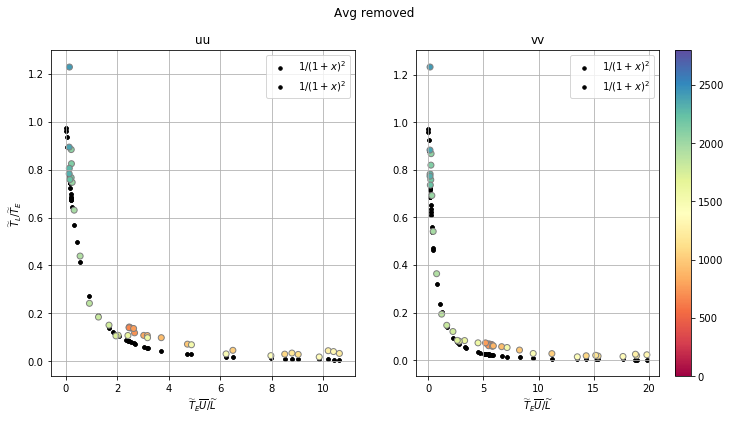

In [24]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Uprime_mean).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
   # ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    #ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    #ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')

Text(0.5, 0.98, 'Avg removed')

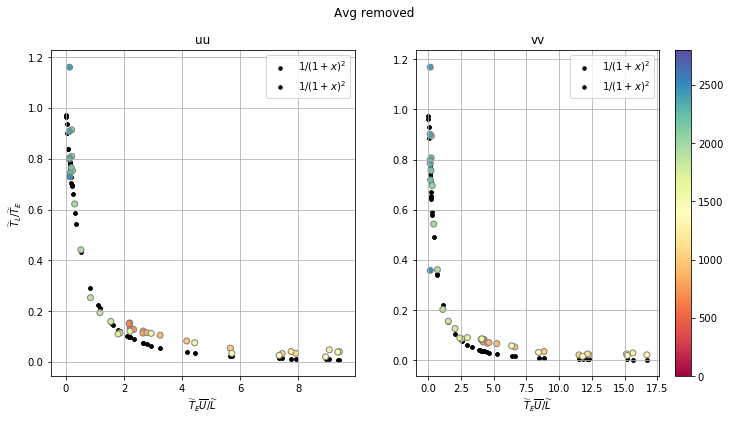

In [37]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Uprime_mean).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
   # ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    #ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    #ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')

Text(0.5, 0.98, 'Avg removed')

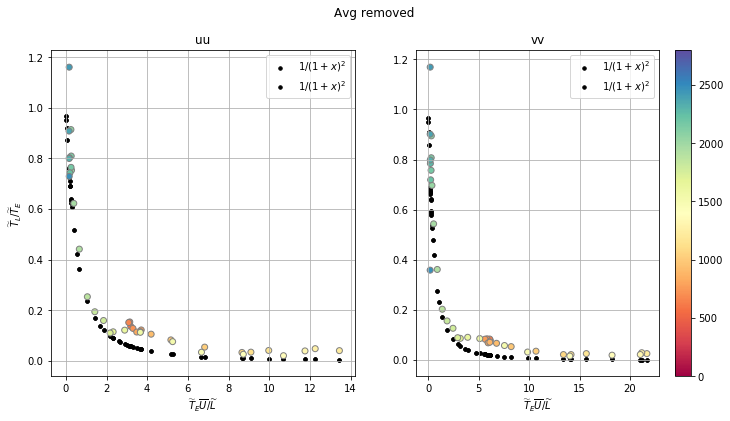

In [38]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Uprms_mean).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
   # ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    #ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    #ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')

Text(0.5, 0.98, 'Avg removed')

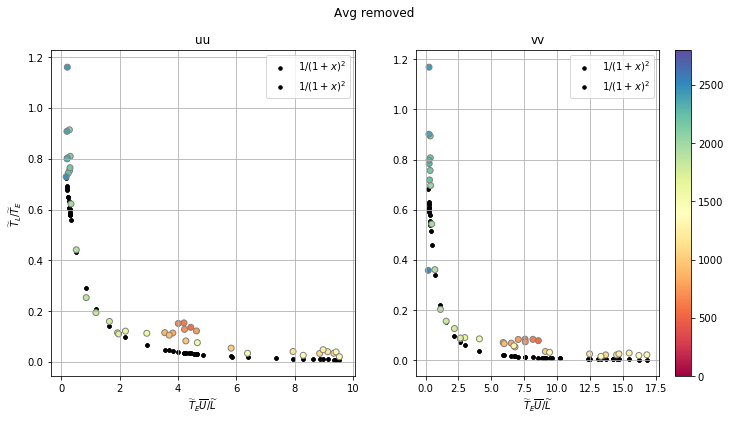

In [34]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Upb_mean).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
   # ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    #ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    #ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')

Text(0.5, 0.98, 'Avg removed')

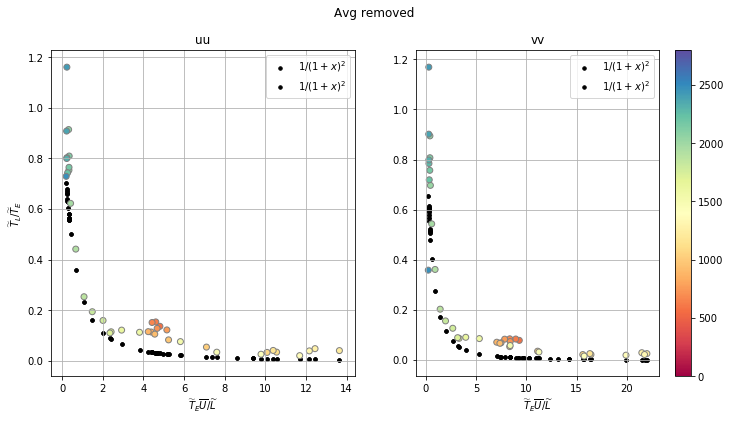

In [35]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Uprms_mean).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
   # ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    #ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    #ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')

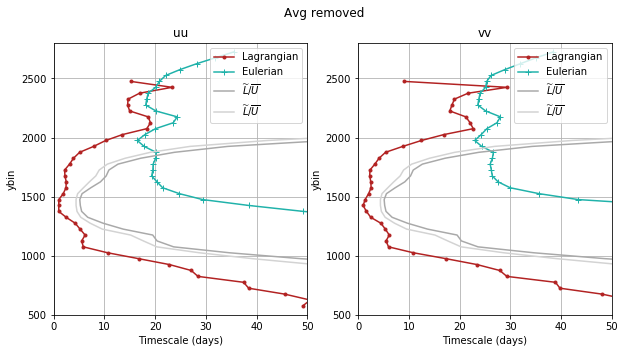

In [39]:
fig,axs = plt.subplots(1,2,figsize=(10,5))
for V,ax in zip(['uu','vv'],axs):
    out_combL_avg[V].params.sel(param='Tt').plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
    out_combE_avg[V].params.sel(param='Tt').plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
    Lt_Uprime_mean.plot(ax=ax,y='ybin',c='darkgrey',label=r'$\widetilde{L}/\overline{U}$')
    Lt_Uprms_mean.plot(ax=ax,y='ybin',c='lightgrey',label=r'$\widetilde{L}/\overline{U}$')
    ax.set_ylim(500,2800);ax.set_xlim((0,50));ax.set_xlabel('Timescale (days)')
    ax.legend();ax.grid();ax.set_title(V)
    fig.suptitle('Avg removed')
#fig,axs = plt.subplots(1,2,figsize=(10,5))
#for V,ax in zip(['uu','vv'],axs):
#    out_combL[V].params.sel(param='Tt').plot(y='ybin',c=cl,ax=ax,marker='.',label='Lagrangian')
#   out_combE[V].params.sel(param='Tt').plot(y='ybin',c=ce,ax=ax,marker='+',label='Eulerian')
#    Lt_Ub_mean.plot(ax=ax,y='ybin',c='grey',label=r'$\widetilde{L}/\overline{U}$')
#    ax.set_ylim(500,2800);ax.set_xlim((0,50));ax.set_xlabel('Timescale (days)')
#    ax.legend();ax.grid();ax.set_title(V)
#    fig.suptitle('Total')

Text(0.5, 0.98, 'Total')

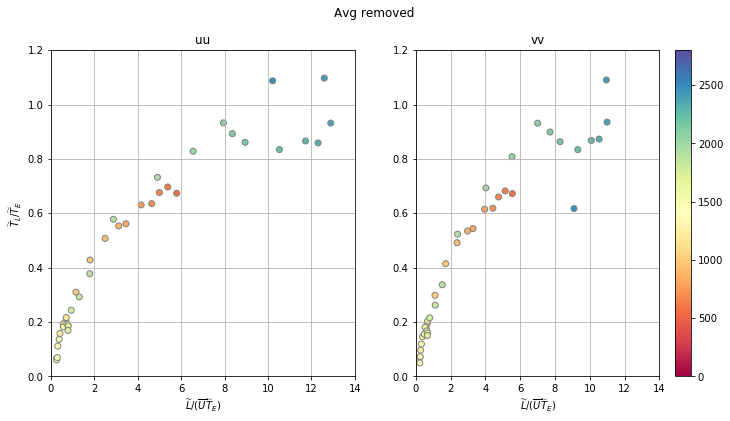

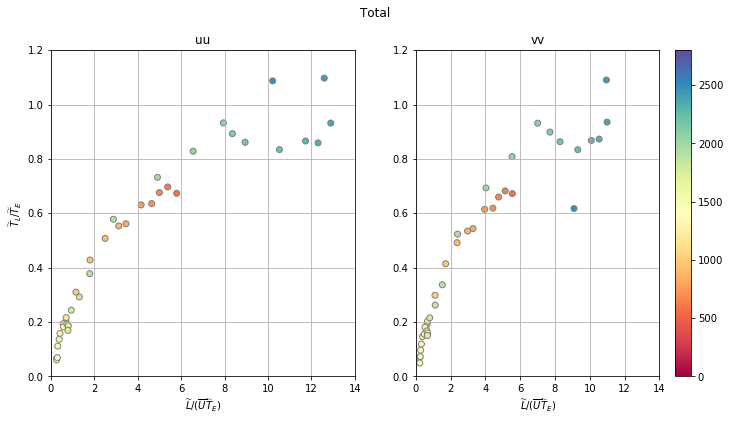

In [89]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (Lt_Ub_mean/out_combE_avg[V].params.sel(param='Tt')).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
    ax.set_xlim(0.,14);ax.set_ylim(0,1.2)
    ax.set_xlabel(r'$\widetilde{L}/(\overline{U}\widetilde{T}_E)$');ax.grid();ax.set_title(V)
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (Lt_Ub_mean/out_combE_avg[V].params.sel(param='Tt')).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
    ax.set_xlim(0.,14);ax.set_ylim(0,1.2)
    ax.set_xlabel(r'$\widetilde{L}/(\overline{U}\widetilde{T}_E)$');ax.grid();ax.set_title(V)
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm);fig.suptitle('Total')

Text(0.5, 0.98, 'Total')

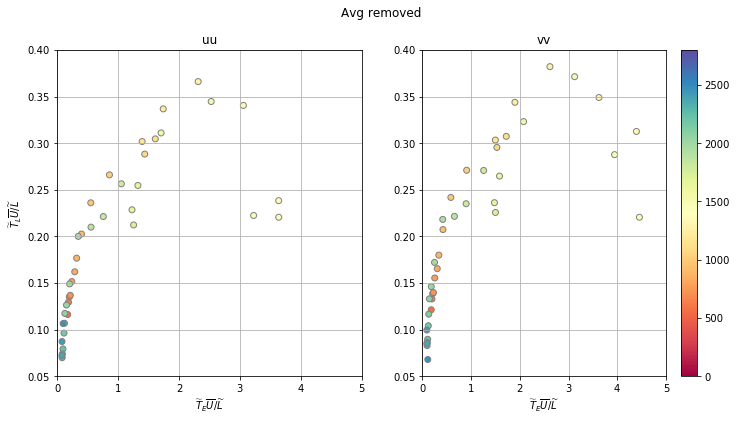

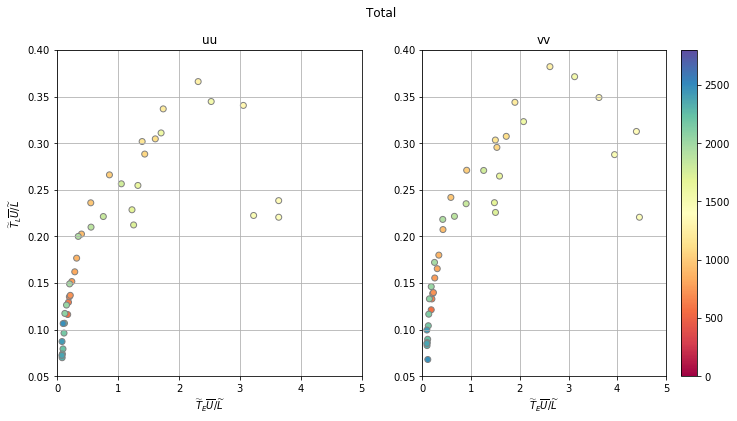

In [90]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Ub_mean).sel(ybin=out_combL_avg[V].dropna(dim='ybin').ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt').dropna(dim='ybin')/Lt_Ub_mean.sel(ybin=out_combL_avg[V].dropna(dim='ybin').ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].dropna(dim='ybin').ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
    ax.set_xlim(0.,5);ax.set_ylim(0.05,0.4)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
axs[0].set_ylabel(r'$\widetilde{T}_L\overline{U}/\widetilde{L}$')
plt.colorbar(cm)
fig.suptitle('Avg removed')
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Ub_mean).sel(ybin=out_combL_avg[V].dropna(dim='ybin').ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt').dropna(dim='ybin')/Lt_Ub_mean.sel(ybin=out_combL_avg[V].dropna(dim='ybin').ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].dropna(dim='ybin').ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
    ax.set_xlim(0.,5);ax.set_ylim(0.05,0.4)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
axs[0].set_ylabel(r'$\widetilde{T}_L\overline{U}/\widetilde{L}$')
plt.colorbar(cm);fig.suptitle('Total')

Text(0.5, 0.98, 'Total')

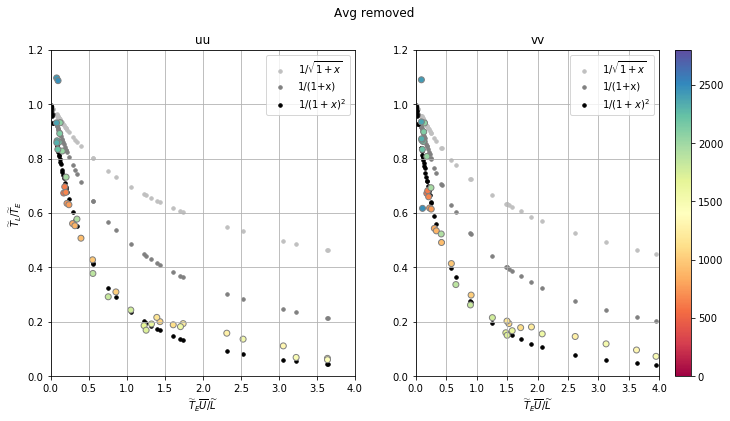

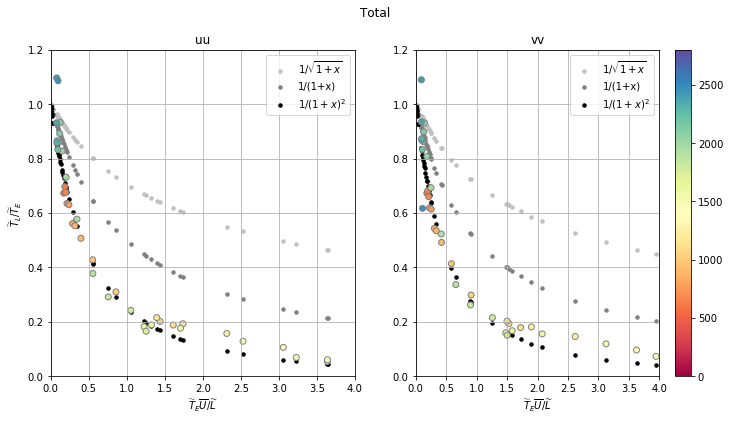

In [91]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE_avg[V].params.sel(param='Tt')/Lt_Ub_mean).sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    y = out_combL_avg[V].params.sel(param='Tt')/out_combE_avg[V].params.sel(param='Tt').sel(ybin=out_combL_avg[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL_avg[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
    ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Avg removed')
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V , ax in zip(['uu','vv'],axs):
    x = (out_combE[V].params.sel(param='Tt')/Lt_Ub_mean).sel(ybin=out_combL[V].ybin.values,method='nearest')
    y = out_combL[V].params.sel(param='Tt')/out_combE[V].params.sel(param='Tt').sel(ybin=out_combL[V].ybin.values,method='nearest')
    cm = ax.scatter(x,y,c=out_combL[V].ybin.values,vmin=0,vmax=2800,cmap='Spectral',edgecolor='grey');
    ax.set_xlim(0.,4.);ax.set_ylim(0,1.2)
    ax.scatter(x,1/np.sqrt(1+x),s=12,c='silver',label=r'1/$\sqrt{1+x}$',zorder=-1)
    ax.scatter(x,1/(1+x),s=12,c='grey',label='1/(1+x)',zorder=-1)
    ax.scatter(x,1/(1+x)**2,s=12,c='k',label=r'1/$(1+x)^2$',zorder=-1)
    ax.set_xlabel(r'$\widetilde{T}_E\overline{U}/\widetilde{L}$');ax.grid();ax.set_title(V)
    ax.legend()
axs[0].set_ylabel(r'$\widetilde{T}_L/\widetilde{T}_E$')
plt.colorbar(cm)
fig.suptitle('Total')

In [25]:
out_combL_avg['uu']

<xarray.Dataset>
Dimensions:  (lags: 5761, param: 5, ybin: 55)
Coordinates:
  * param    (param) <U6 'Tt' 'Xtilde' 'Tb' 'Xbar' 'Omega'
  * lags     (lags) float64 0.0 0.006944 0.01389 0.02083 ... 39.99 39.99 40.0
  * ybin     (ybin) float64 25.0 75.0 125.0 ... 2.625e+03 2.675e+03 2.725e+03
Data variables:
    params   (ybin, param) float64 nan nan nan nan nan ... nan nan nan nan nan
    fitted   (ybin, lags) float64 nan nan nan nan nan ... nan nan nan nan nan

In [48]:
DS = xr.Dataset(data_vars={'Ta' : Lt_Ub_mean, 'E_u_avg': out_combE_avg['uu'].params.sel(param=['Tt','Xbar']),
                           'L_u_avg' : out_combL_avg['uu'].params.sel(param=['Tt','Xbar']),
                           'E_v_avg' : out_combE_avg['vv'].params.sel(param=['Tt','Xbar']),
                           'L_v_avg' : out_combL_avg['vv'].params.sel(param=['Tt','Xbar']),
                           'Ubar' : Ubar,
                          'E_u': out_combE['uu'].params.sel(param=['Tt','Xbar']),
                           'L_u' : out_combL['uu'].params.sel(param=['Tt','Xbar']),
                           'E_v' : out_combE['vv'].params.sel(param=['Tt','Xbar']),
                           'L_v' : out_combL['vv'].params.sel(param=['Tt','Xbar'])
                          })

In [26]:
DS_avg = xr.Dataset(data_vars={'Ta' : Lt_Uprime_mean,'Ta_u' : Lt_U_mean,'Ta_v' : Lt_V_mean,'Ta_rms' : Lt_Uprms_mean,
                               'E_u_avg': out_combE_avg['uu'].params,#.sel(param=['Tt','Xbar','Tb'])
                               'L_u_avg' : out_combL_avg['uu'].params,#.sel(param=['Tt','Xbar','Tb']),
                               'E_v_avg' : out_combE_avg['vv'].params,#.sel(param=['Tt','Xbar','Tb']),
                               'L_v_avg' : out_combL_avg['vv'].params,#.sel(param=['Tt','Xbar','Tb']),
                              'Uprime' : Uprime,'Urms':Uprms,'U' : U_a,'V' : V_a
                          })

In [27]:
DS_U = xr.Dataset(data_vars={'Ta' : Lt_Ub_mean,'Ta_rms' : Lt_Urms_mean,
                           'Ubar' : Ubar,'Urms':Urms,'Uprms':Uprms,'Upb':Upb
                          })

In [27]:
r.store_diagnostic('ZC_param_fit_T80', DS_avg, overwrite=True,file_format='netcdf')

data stored in /home/datawork-lops-osi/equinox/jetn/jet_cfg1_wp7_m1a1_4km_500a1000j/diagnostics/ZC_param_fit_T80.nc


### Sensibility to weight : 


In [14]:
ds20 = xr.open_dataset(path+'ZC_param_fit_T40.nc')
ds20_w = xr.open_dataset(path+'ZC_param_fit_T80_weighted.nc')
ds40 = xr.open_dataset(path+'ZC_param_fit_T80.nc')

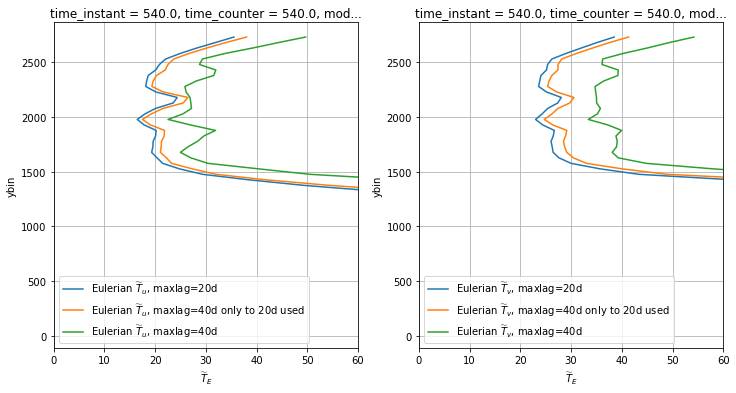

In [32]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V, ax in zip(['uu','vv'],axs):
    ds20['E_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Eulerian $\widetilde{T}_%s$, maxlag=20d'% V[0])
    ds20_w['E_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Eulerian $\widetilde{T}_%s$, maxlag=40d only to 20d used'% V[0])
    ds40['E_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Eulerian $\widetilde{T}_%s$, maxlag=40d'% V[0])
    ax.legend();ax.grid()
    ax.set_xlabel('$\widetilde{T}_E $');ax.set_xlim(0,60)

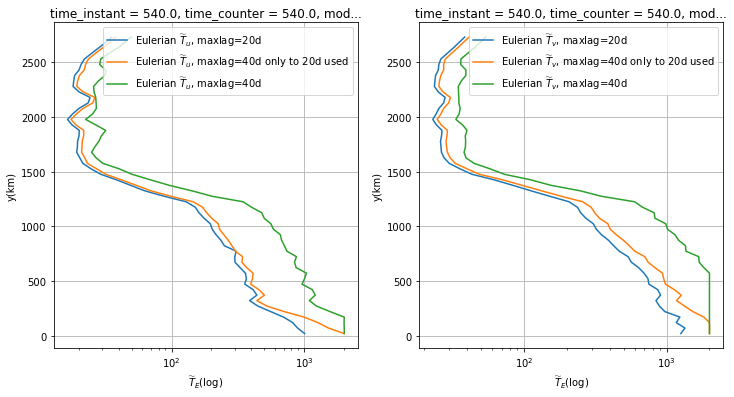

In [28]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V, ax in zip(['uu','vv'],axs):
    ds20['E_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Eulerian $\widetilde{T}_%s$, maxlag=20d'% V[0])
    ds20_w['E_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Eulerian $\widetilde{T}_%s$, maxlag=40d only to 20d used'% V[0])
    ds40['E_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Eulerian $\widetilde{T}_%s$, maxlag=40d'% V[0])
    ax.legend();ax.grid()
    ax.set_xscale('log');ax.set_ylabel('y(km)');ax.set_xlabel('$\widetilde{T}_E $(log)')

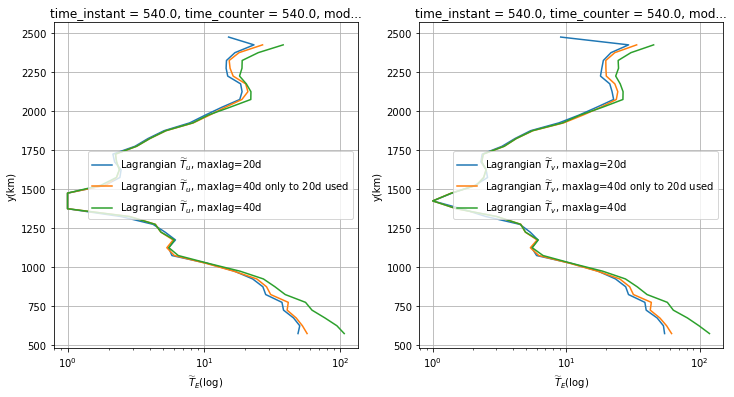

In [33]:
fig,axs = plt.subplots(1,2,figsize=(12,6))
for V, ax in zip(['uu','vv'],axs):
    ds20['L_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Lagrangian $\widetilde{T}_%s$, maxlag=20d'% V[0])
    ds20_w['L_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Lagrangian $\widetilde{T}_%s$, maxlag=40d only to 20d used'% V[0])
    ds40['L_%s_avg'%V[0]].sel(param='Tt').plot(ax=ax,y='ybin',label=r'Lagrangian $\widetilde{T}_%s$, maxlag=40d'% V[0])
    ax.legend();ax.grid()
    ax.set_xscale('log');ax.set_ylabel('y(km)');ax.set_xlabel('$\widetilde{T}_E $(log)')

In [50]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
concurrent.futures._base.CancelledError
